# AVAlanche of Music: Explainer Notebook
Website : https://sites.google.com/view/avalanche-of-music/
Network analysis is found in MusicianNetworkAnalysis file

---

In [1]:
# imports
import os
import re
import json
import scipy
import numpy as np
import pandas as pd
from tabulate import tabulate

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

import networkx as nx
import urllib.request
from tqdm.auto import tqdm

In [2]:
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.stem import WordNetLemmatizer
tokenizer = WordPunctTokenizer()
lemmatizer = WordNetLemmatizer()
stopwords = nltk.corpus.stopwords.words('english')
from nltk import sentiment
from nltk.sentiment import vader
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import PlaintextCorpusReader
from nltk.probability import FreqDist
from nltk import word_tokenize
# nltk.download('vader_lexicon')

# !pip install lyricsgenius
import lyricsgenius as lg
## insert your lyrics genius token
genius = lg.Genius('epn7FPrEIuEBfpWLO-9kkwGGNsYUgsvPgfoOnb04VtXtDf7gg2k_s8mfNdTXdJnI', \
                   skip_non_songs=True, excluded_terms=["(Remix)", "(Live)"], remove_section_headers=True)

from wordcloud import WordCloud
from PIL import Image

# 1. Motivation
### What is your dataset?
#### A. Network. 
- Our dataset is all about music artists and to start creating our network, we needed a list of artist's names. Rather than scrapping Wikipedia's long and convoluted categories and lists of musicians, we decided on using Genius database of artists. We took all 18770 names listed on [All Artists on Genius](https://genius.com/artists). 

- However, as explained in more details in Section 2, this list required to be preprocessed, enriched and cleaned. All in all, we ended up with 10191 Wikipedia page names from which we created the complete network.

- From this list, we queried each Wikipedia page to retreive its content, using Wikipedia API as done in Week 1 and 4. As node attributes, we decided to extract from each page the artist's birth year and genres (if specified, otherwise 'Unknown') from the Infobox, as well as the length of the page (number of characters). We also extracted all the links to other wikipedia pages and keep them as edges if they link to another artist in the dataset.

#### B. Lyrics
- We identified all nodes from the GCC that have a degree of >= 90 (aka the total amount of in and out links from their wiki page) and added them to our initial list. We further reviewed the list and determined if the artists have actual lyrics attached to them in Genius. We did this by attempting to download songs from all of the artists using the Genius Lyrics API. During this process we realised some did not have actual lyrics attached to them (such as if they are a DJ, or a singer attached to a band that has lyrics) - so we removed them. We also encountered various name differences between the node names and the artist name that Genius expected, so we needed to keep track of the correct names. 
- Later on during community detection, we realised that various communities did not have a lot of representation with the above list of high-degree artists. Thus we identified some communities to enrich, including Spanish artists, German bands (that Victor happens to know), Gospel artists, and French rappers, to ensure that at least 10 artists from those communities had songs downloaded (or if the community had only 6, we took all artists!)
- We downloaded each artist's top 20 most popular songs using the Genius Lyrics API. The songs are sorted by popularity due to how many views the song lyrics have had on the Genius website. The songs were saved into a single txt file per artist. Finally, we looked through each txt to check if the songs were in English. We removed artists that have met a certain threshold of having non-English tokens (such as Shakira or J Balvin) from sentiment analysis since LabMT and VADER would not be able to analyse their sentiment appropriately. However we will keep the non-English speaking artists txt files for further TC-IDF and wordcloud analysis! 


### Why did you choose this/these particular dataset(s)?
- All of us are very interested in song lyrics. We initially wanted to analyze a network beginning from a few nodes of our favorite artists and then create a larger network through iterations of wiki page links, but realised through feedback from Project A, that analysing the entire network of musical artists would reduce bias inside the network.

### What was your goal for the end user's experience?
- We wanted to provide end users with the answer to a lot of interesting questions about musical artists, such as... 
1. Who are the most and least positive artists based on lyric analysis?
2. What words do well-known artists use most frequently compared to other artists? 
3. What genres are the most and least positive? 
4. Are genres a good way to form communities of a network?

# 2. Basic stats. Let's understand the dataset better
- Write about your choices in data cleaning and preprocessing
- Write a short section that discusses the dataset stats (here you can recycle the work you did for Project Assignment A)


### Prestep: Building the Network using files generated in MusicianNetworkAnalysis

In [3]:
def build_network(nodes_attributes, nodes_edges):
    # ---=== Create GRAPH ===---
    G = nx.DiGraph()
    # Create nodes
    for node, attr in nodes_attributes.items():
        G.add_node(node, age=attr['age'], genres=attr['genres_cleaned'], lengthPage=attr['lengthPage'])
    # Create edges
    for node, edges in nodes_edges.items():
        for target in edges:
            G.add_edge(node, target)
    return G
# Read Network data from json files
with open('full_network_attributes_cleaned.json') as f:
    nodes_attributes = json.load(f)
with open('full_network_edges.json') as f:
    nodes_edges = json.load(f)
G = build_network(nodes_attributes, nodes_edges)
UG = G.to_undirected()

# Extract the largest component
GCC_set = max(nx.weakly_connected_components(G), key=len)
GCC = G.subgraph(GCC_set).copy()
UGCC = GCC.to_undirected()

In [4]:
G.number_of_nodes(), G.number_of_edges(), UG.number_of_edges()

(10191, 96521, 81940)

## A. Lyric Analysis

### Total analysis is over 397 artists and 7,940 songs (one txt file per artist containing 20 songs each)

**First we identify and clean the list of artists to analyse.**

**Where do the 397 artists come from?**
1. We identify all nodes that have a total degree of 90 or more. We initially wanted to do artists with degree 100+, but noticed a lot of popular, interesting, and diverse artists that had between 90 and 100 nodes, so we increased our dataset.
2. We remove artists from the lists if they do not have lyrics attached in Genius (such as if they are a DJ, or a single person from a band, or a charity band that does not have real songs). 
3. The artist_enrich list comes from an initiative to add more artists based on communities identified through the Louvain algorithm - several communities were lacking in lyric content, so we chose some to round out here. We added 10 artists to community 16 of French rappers, based on top degree. We added all 6 artists from community 18 which has German bands. Next we added the top degree 10 artists from community 5 of Christian musicians. We rounded out community 14 to have 10 more artists as well. Finally we added some low degree nodes to community 2.


In [5]:
# artist enrichment list for enhancing network based on communities identified
artist_enrich = ['Ben Howard', 'Cage the Elephant', 'Kings of Leon', 'Chelsea Cutler', 'Astrid S', \
                 'Sigrid (singer)', 'Girl in Red', 'Amy Grant', 'Michael W. Smith', 'Steven Curtis Chapman', \
                 'Petra (band)', 'TobyMac','Newsboys', 'Chris Tomlin', 'Jars of Clay', 'Hawk Nelson', \
                 'Elevation Worship', 'Until the Ribbon Breaks', 'Thalía', 'Bad Bunny','Wisin','Anuel AA',\
                'Gloria Estefan','Nicky Jam','Marc Anthony', 'Booba', 'Gims', 'Dadju','La Fouine', 'Alonzo (rapper)', \
                'Lacrim','Ninho', 'Orelsan','Nekfeu', 'Stromae', 'AnnenMayKantereit','Element of Crime','Von Wegen Lisbeth',\
                'Fil Bo Riva','Giant Rooks', 'Gisbert zu Knyphausen', 'Tom Grennan', 'Foals (band)', 'The Kooks']

# identify the list of artists to download lyrics for (who have degree 90+)
artist_deg = {}
artist_90deg=[]
for node in G.nodes():
    if G.degree(node)>=90 or node in artist_enrich:
        artist_deg[node]=G.degree(node)
        artist_90deg+=[node]

# sort artists by their degree
artist_deg_sorted = sorted(artist_deg.items(), key= lambda x: x[1], reverse=False)

# clear artists that do not have lyrics in Genius, or that were inappropriately added
artist_90deg.remove('Adam Levine')
artist_90deg.remove('Zane Lowe')
artist_90deg.remove('Brian Eno')
artist_90deg.remove('Miles Davis')
artist_90deg.remove('Vitamin String Quartet')
artist_90deg.remove('Band Aid (band)')
artist_90deg.remove('Slash (musician)')
artist_90deg.remove('Kurt Hugo Schneider')
artist_90deg.remove('Marilyn Manson (band)')

**We then use the Genius Lyrics API to download each artist's 20 most popular songs.**
#### Code below in markdown to avoid running the cell:
It takes an extremely long time to run, and we already have the cleaned lyrics txt files in a folder called /Lyrics/. Acquire a Genius Lyrics API key to run it on your own!

```python
## This saves all of an artists' songs into a single txt file
def save_lyrics(artists, song_limit):
    c = 0
    path = './Lyrics/'
    fail_list = []
    for artist in artists:
        try:
            # Sorts = popularity, release_date, title
            songs = (genius.search_artist(artist, max_songs=song_limit, sort='popularity')).songs
            song_lyrics_list = [song.lyrics for song in songs]
            artist = re.sub(" ", "_", artist)
            # handle AC/DC file to AC_DC
            artist = re.sub("/", "_", artist)
            print("hello",artist+".txt")
            with open(path+artist+".txt", "w", encoding='utf-8') as file:
                file.write("\n\n".join(song_lyrics_list))
            c += 1
            print(f"Songs grabbed:{len(song_lyrics_list)}")
            print("___________________________________________________\n\n\n\n")
        except:
            print(f"FAILURE at {artist}: {c}") # make it clear when there's a failure, and at what point
            fail_list += [artist]
            print(f"current failure list = {fail_list}") # keep track of the artists that failed
            
# save the files 
save_lyrics(artist_90deg, 20)
```

**Now we clean the txt files.**
1. The Genius Lyrics API adds some strange text to the final word of each song, so we needed to open each txt file and clean them using regex. The patterns we noticed (at different times) were #EmbedShare, ##EmbedShare, ###EmbedShare, and finally EmbedShare attached to a word. We ended up coming back here to add more patterns to remove a few times.
2. We changed all lyrics to lowercase so that we could have a more accurate dataset of words. We do not want uppercase words to count differently than lowercase words.

In [6]:
# clean up weird text auto-added by Genius Lyrics API inside the txt files - only needs to be done once
folder='./Lyrics/'
file_names = sorted(os.listdir(folder))
for file in file_names:
    if file[-4:]!=".txt": # ignore the weird files
        continue
    fin = open(folder+file, "rt")
    
    #read file contents to string
    data = fin.read()
    
    #replace all occurrences of the required string
    data = data.replace('URLCopyEmbedCopy', '')
    pattern1 = '\d{1}EmbedShare'
    pattern2 = '\d{2}EmbedShare'
    pattern3 = '\d{3}EmbedShare'
    data = re.sub(pattern3, '', data)
    data = re.sub(pattern2, '', data)
    data = re.sub(pattern1, '', data)
    data = data.lower() # lowercase!
    #close the input file
    fin.close()
    
    #open the input file in write mode
    fin = open(folder+file, "wt")
    
    #overrite the input file with the resulting data
    fin.write(data)
    
    #close the file
    fin.close()

**We create a dataframe of our 397 artists for easier retrieval of artists and their nodal attributes later**
1. We used a regex pattern to strip out the unnecessary suffixes from the artist names. These were added in the network creation so that we could make sure to catch all artists based on their Wikipedia pages, which often have ' (singer)', ' (band)', etc. added to the end. We do not want those for our Lyric analysis though since it makes the names more difficult to handle.

In [7]:
# create dataframes for full list of artists
artist_df = pd.DataFrame(nodes_attributes).T
artist_df = artist_df.reset_index()

# dataframe for artists with 90+ nodes
artist_90deg_df = artist_df.copy()
artist_90deg_df = artist_90deg_df.loc[artist_90deg_df['index'].isin(artist_90deg)]

# clean up the extra characters after the artist name (like (band), (musician), etc)
for i, row in artist_90deg_df.iterrows():
    row['index'] = re.sub('[\(\[].*?[\)\]]', '',row['index']).rstrip()

# keep a list of all the artists with the right name formatting
full_artist_list = artist_90deg_df['index'].tolist()
    
artist_90deg_df

,index,age,genres,lengthPage,genres_cleaned
0,ABBA,Unknown,"[Pop music, pop rock, disco]",138201,"[pop music, pop rock, disco]"
1,AC/DC,Unknown,"[Hard rock, blues rock, rock and roll, Heavy m...",130329,"[hard rock, blues rock, rock and roll, heavy m..."
2,Adele,33,"[Pop music, Reuters, Soul music, AllMusic]",207235,"[pop music, soul music]"
5,Alice in Chains,Unknown,"[Heavy metal music, alternative metal, grunge,...",188865,"[heavy metal music, alternative metal, grunge,..."
8,Amy Winehouse,38,"[Soul music, blue-eyed soul, neo soul, rhythm ...",192843,"[soul music, blue-eyed soul, neo soul, rhythm ..."
...,...,...,...,...,...
9924,Slipknot,Unknown,"[Heavy metal music, nu metal, alternative meta...",136254,"[heavy metal music, nu metal, alternative metal]"
9970,Tool,Unknown,"[Alternative metal, art rock, post-metal, prog...",134400,"[alternative metal, art rock, progressive meta..."
9980,Testament,Unknown,[Thrash metal],76483,[thrash metal]
10002,Trivium,Unknown,"[Heavy metal music, thrash metal, metalcore, p...",67371,"[heavy metal music, thrash metal, metalcore, p..."



# 3. Tools, theory and analysis. Describe the process of theory to insight
- Talk about how you've worked with text, including regular expressions, unicode, etc.
- Describe which network science tools and data analysis strategies you've used, how those network science measures work, and why the tools you've chosen are right for the problem you're solving.
-  How did you use the tools to understand your dataset?

# A: Lyric Analysis

**We started by investigating basic numbers on the 397 txt files of lyrics. First we identified the top and bottom 10 artists for word count**

We open each txt file, count up the number of words used, and divide by 20 to get the average amount of words per song. Rappers are the winners of most-lyrics here.

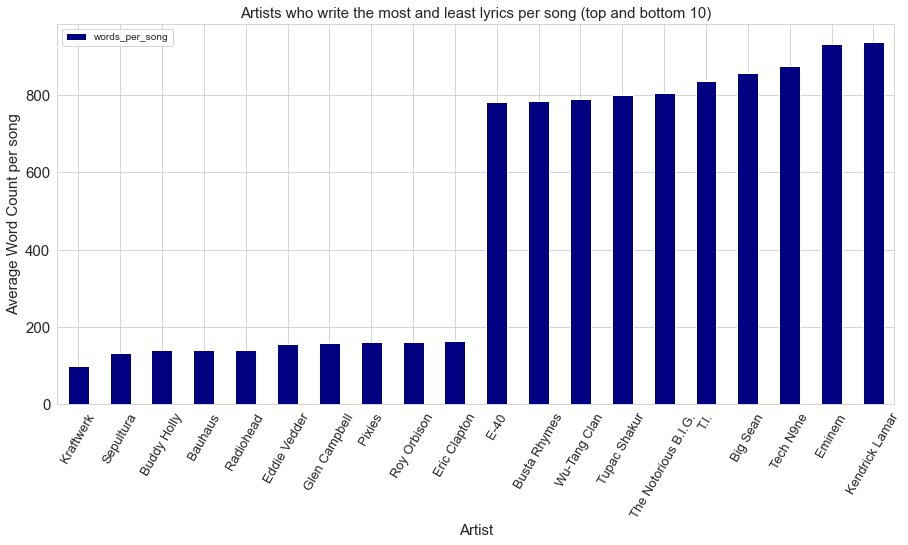

In [8]:
# set this to the amount of songs downloaded per artist
song_count = 20

# initialize a df for easier plotting
df_avg_words = pd.DataFrame(columns=('artist', 'words_per_song'))

# prep the folder and filenames
folder='./Lyrics/'
file_names = sorted(os.listdir(folder))
i=0

# go through each filename to create the dataframes
for file_name in file_names:
    if file_name[-4:]!=".txt": # ignore the weird files
            continue
    f = open(folder + file_name, 'rb')
    num_words = 0
    words_per_song = 0
    artist = file_name[:-4]
    artist = artist.replace('_', ' ')
    all_text = ''
    for sentence in f.readlines():
        this_sentence = sentence.decode('utf8')
        num_words_this = len(this_sentence.split(" "))
        num_words += num_words_this
    words_per_song = num_words/song_count
    df_avg_words.loc[i] = (artist, words_per_song)
    i+=1

plt.rcParams['figure.figsize'] = (15,7)

# most/least words per song
df_avg_words_top10 = df_avg_words.sort_values(by='words_per_song', ascending=False).head(10)
df_avg_words_bottom10 = df_avg_words.sort_values(by='words_per_song', ascending=True).head(10)

avg_df = df_avg_words_bottom10.append(df_avg_words_top10).sort_values(by='words_per_song', ascending=True)
avg_df.plot.bar(x='artist', y='words_per_song', title='Artists who write the most and least lyrics per song', rot=60, 
            color = 'navy')
plt.ylabel('Average Word Count per song', fontsize=15)
plt.xlabel('Artist',fontsize=15)
plt.title('Artists who write the most and least lyrics per song (top and bottom 10)',fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=15)
plt.show()

**We identified the distribution of average song lengths through a histogram**

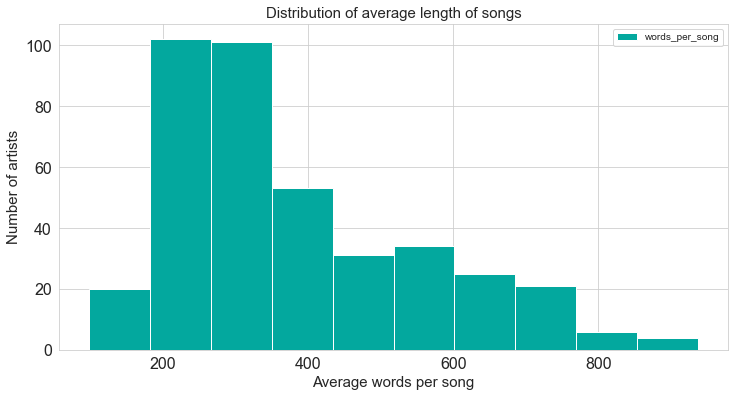

In [9]:
# set this to the amount of songs downloaded per artist
song_count = 20

# initialize a df for easier plotting
df_words_per_song = pd.DataFrame(columns=('artist', 'words_per_song'))

# prepare the folder and filenames
folder='./Lyrics/'
file_names = sorted(os.listdir(folder))
i=0

for file_name in file_names:
#     artist = re.sub(" ", "_", artist)
    if file_name[-4:]!=".txt": # ignore the weird files
            continue
    f = open(folder + file_name, 'rb')
    num_words = 0
    words_per_song = 0
    artist = file_name[:-4]
    artist = artist.replace('_', ' ')
    all_text = ''
    for sentence in f.readlines():
        this_sentence = sentence.decode('utf-8')
        num_words_this = len(this_sentence.split(" "))
        num_words += num_words_this
    words_per_song = num_words/song_count
    df_words_per_song.loc[i] = (artist, words_per_song)
    i+=1

plt.rcParams['figure.figsize'] = (12,6)
df_words_per_song.plot.hist(color='#03A89E')
plt.title('Distribution of average length of songs', fontsize=15)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Number of artists', fontsize = 15) # Y label
plt.xlabel('Average words per song', fontsize = 15) # X label
plt.show()

**Sentiment Analysis on artists:**
1. We wanted to perform sentiment analysis on each artist's lyrics using LabMT and VADER

**LabMT:**
- We identified the tokens in each artist's lyrics that were also included inside the LabMT lexicon. If it was included in the LabMT lexicon, we added the associated happiness_average score, and added 1 to the denominator. The end result is adding up all of the happiness_average scores of the tokens and dividing by the number of tokens that actually appear in the lexicon. We needed to do this to ensure the denominator was not inflated by counting words that do not appear in the lexicon.
- The minimum happiness_average out of all the words in the LabMT lexicon is 1.30, while the highest is 8.50.

**VADER:**
- VADER needs to be given individual sentences, with the capitalization and punctuation intact. We ran the VADER analyzer program over all of the sentences within each artist's lyrics file. 
- We used the "compound" score given by VADER because that indicates a score from -1 to 1 to show the polarity of the sentence's sentiment. 0 means that the sentence is neutral, -1 is the most negative score, and 1 is the most positive score. We added the compound score for all sentences and divided by the number of sentences to produce the average per artist.
    
**Thus we created dictionaries to store each artist's lyrics in the appropriate format that LabMT and VADER expect**
 

In [10]:
def create_dict_artists_lyrics(folder='./Lyrics/'):
    artists_lyrics = {}
    file_names = sorted(os.listdir(folder))
    # Go through the list
    for file_name in file_names:
        if file_name[-4:]!=".txt": # ignore the weird files
            continue
            
        # Read the file containing the lyrics
        file = open(folder+"/"+file_name, "r")
        lyrics = file.read()
        file.close()

        # Tokenize the text
        tokens = tokenizer.tokenize(lyrics)

        # Exclude punctuation and stop words, set everything to lower case
        tokens = [token.lower() for token in tokens if token.isalpha() and token.lower() not in stopwords]

        # remove underscores and .txt from the artist name
        artist = file_name[:-4]
        artist = artist.replace('_', ' ')
        
        # Lemmatize the words for LabMT
        output_LabMT = [lemmatizer.lemmatize(token) for token in tokens]
        artists_lyrics[artist]={}
        artists_lyrics[artist]['LabMT'] = output_LabMT

        # VADER cleanup
        output_VADER = lyrics.replace('\u2005', ' ')
        output_VADER = output_VADER.replace('\u205f', ' ')
        output_VADER = output_VADER.replace('\\', '')
        output_VADER = output_VADER.replace('"', ' ')
        output_VADER = output_VADER.split('\n')
        output_VADER = list(filter(None, output_VADER)) # remove unnecessary spacing
        artists_lyrics[artist]['VADER'] = output_VADER

    return artists_lyrics

artists_lyrics = create_dict_artists_lyrics()

**Now we import the necessary LabMT information**

In [11]:
# load the LabMT word list
LabMTwordlist = pd.read_csv('./Data_Set_S1.txt', sep="\t", skiprows=3)

# create a dictionary to store the happiness average per word
LabMTwordsentiment = dict(zip(LabMTwordlist.word, LabMTwordlist['happiness_average']))

**We knew we had artists that have non-English lyrics. These lyrics cannot be accurately given a sentiment score by LabMT and VADER since they only work for English. So, we created a function lost_tokens to identify how many tokens are in artists' songs that LabMT cannot recognize. This is essentially a proxy, since it will not completely tell us which artists are non-English speaking. We decided to remove artists with > 20% of tokens non-recognisable by LabMT from the sentiment analysis (not the later wordclouds though).**

In [12]:
# function to identify how many tokens LabMT cannot find
def lost_tokens(artist):
    tokens_in = 0
    for token in artists_lyrics[artist]['LabMT']:
        if token in LabMTwordsentiment.keys():
                tokens_in+=1
    return (len(artists_lyrics[artist]['LabMT'])-tokens_in)/len(artists_lyrics[artist]['LabMT'])

# artist removal list - if over 20% of the tokens are not recognizable by LabMT, we expect they are too foreign
artist_removal=[]
artist_sentiment_list=[]
for name in artists_lyrics.keys():
    if lost_tokens(name)>0.2:
        artist_removal+=[name]
    else:
        artist_sentiment_list+=[name] # use this later on to make sure we are only calculating sentiment for the right artists

In [13]:
# show the artists not considered for sentiment analysis in VADER/LabMT
artist_removal

['Alonzo',
 'AnnenMayKantereit',
 'Anuel AA',
 'Bad Bunny',
 'Bauhaus',
 'Booba',
 'Daddy Yankee',
 'Dadju',
 'Element of Crime',
 'Elevation Worship',
 'Gims',
 'Gisbert zu Knyphausen',
 'J Balvin',
 'Kraftwerk',
 'La Fouine',
 'Lacrim',
 'Marc Anthony',
 'Nekfeu',
 'Nicky Jam',
 'Ninho',
 'Orelsan',
 'Ricky Martin',
 'Shakira',
 'Stromae',
 'Thalía',
 'Von Wegen Lisbeth',
 'Wisin']

**Now we are ready to define a function to compute the sentiment score using LabMT, given a list of tokens.**

In [14]:
# Given a list of tokens, calculate the sentiment score using LabMT wordlist
def calculate_sentiment(list_tokens):
    global LabMTwordsentiment
    s = 0
    total = 0
    # if the token is not inside the LabMT list, do not add it to the denominator!
    for token in list_tokens:
        if token in LabMTwordsentiment.keys():
            s += LabMTwordsentiment[token]
            total += 1
    
    if total != 0:
        return s/total
    else:
        return np.nan

**Finally we load the VADER sentiment analyzer!**

In [15]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

**At long last we can actually store the sentiment values for each artist based on LabMT and VADER into a dictionary for each sentiment score.**

In [16]:
# dictionaries to store sentiments
sentiment_labmt = {}
sentiment_vader = {}

for name in artists_lyrics.keys():
    # only check artists we need
    if name in artist_removal:
        continue
        
    # LabMT   
    sentiment_labmt[name] = calculate_sentiment(artists_lyrics[name]['LabMT'])
    
    # VADER  
    totalv = 0
    sentences = artists_lyrics[name]['VADER']
    for sentence in sentences:
        totalv += analyzer.polarity_scores(sentence)['compound']
    sentiment_vader[name] = totalv/len(sentences)

**We look at histograms to see the distribution of artist sentiment scores using both tools**

The LabMT score distribution shows that most artists have a quite positive song collection. The minimum happiness_average out of all the words in the LabMT lexicon is 1.30, while the highest is 8.50. Our sentiment scores all fall between 5.0 and 6.0 which indicates a generally positive sentiment.
    
    
For VADER, the majority of artists have positive songs since most artists have a total score above 0.0. The x axis range is -1 (negative) to 1 (positive), with 0 being neutral. 

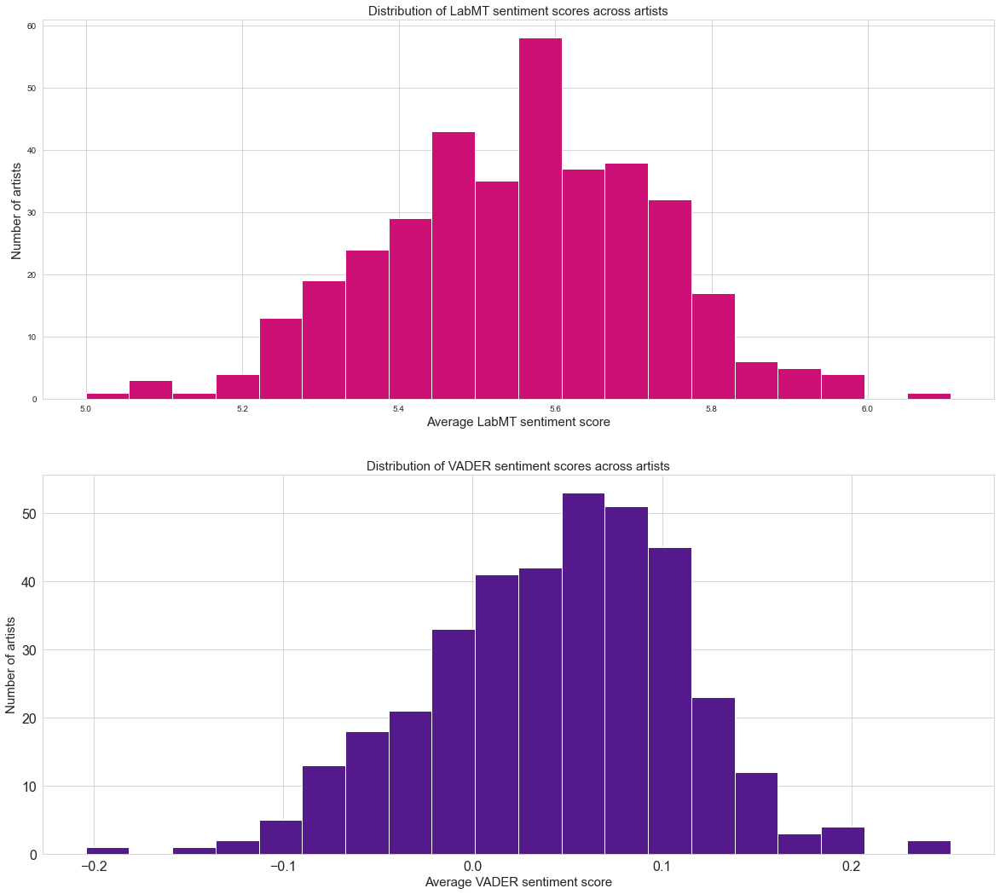

In [17]:
# Create a histogram of all artist's associated sentiments for LabMT and VADER
fig, axes = plt.subplots(2, 1, figsize=(20, 18))
plt.xticks(fontsize=16)

axes[0].hist(sentiment_labmt.values(), bins=20,color='#CD1076')
axes[0].set_title('Distribution of LabMT sentiment scores across artists', size=15) # Title
axes[0].set_ylabel('Number of artists', fontsize = 15) # Y label
axes[0].set_xlabel('Average LabMT sentiment score', fontsize = 15) # X label


plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

axes[1].hist(sentiment_vader.values(), bins=20,color='#551A8B')
axes[1].set_title('Distribution of VADER sentiment scores across artists', size=15) # Title
axes[1].set_ylabel('Number of artists', fontsize = 15) # Y label
axes[1].set_xlabel('Average VADER sentiment score', fontsize = 15) # X label

plt.show()

**Next we create tables to easily visualize the most and least positive artists.**

In [18]:
# order the sentiment scores
sentiment_labmt_sorted = sorted(sentiment_labmt.items(), key= lambda x: x[1], reverse=True)
sentiment_vader_sorted = sorted(sentiment_vader.items(), key= lambda x: x[1], reverse=True)

# show happiest table 
sentiment_happiest = [(x[0],x[1], ' ', y[0],y[1]) for x,y in zip(sentiment_labmt_sorted[:15],\
                    sentiment_vader_sorted[:15])]
print('15 Artists with happiest lyrics:\n'+ tabulate(sentiment_happiest,
               headers=['Artist', 'LabMT', ' ', 'Artist', 'VADER'],
               showindex=range(1,16), tablefmt="fancy_grid"))

15 Artists with happiest lyrics:
╒════╤════════════════════╤═════════╤═════╤════════════════════╤══════════╕
│    │ Artist             │   LabMT │     │ Artist             │    VADER │
╞════╪════════════════════╪═════════╪═════╪════════════════════╪══════════╡
│  1 │ Chris Tomlin       │ 6.10602 │     │ Luther Vandross    │ 0.252472 │
├────┼────────────────────┼─────────┼─────┼────────────────────┼──────────┤
│  2 │ Stevie Wonder      │ 5.96299 │     │ Buddy Holly        │ 0.231295 │
├────┼────────────────────┼─────────┼─────┼────────────────────┼──────────┤
│  3 │ Amy Grant          │ 5.96149 │     │ Chris Tomlin       │ 0.199419 │
├────┼────────────────────┼─────────┼─────┼────────────────────┼──────────┤
│  4 │ Luther Vandross    │ 5.95607 │     │ Otis Redding       │ 0.196415 │
├────┼────────────────────┼─────────┼─────┼────────────────────┼──────────┤
│  5 │ Chaka Khan         │ 5.94677 │     │ Earth, Wind & Fire │ 0.195273 │
├────┼────────────────────┼─────────┼─────┼────────────

In [19]:
# show most negative
sentiment_saddest = [(x[0],x[1], ' ', y[0],y[1]) for x,y in \
                     zip(sentiment_labmt_sorted[-15:], sentiment_vader_sorted[-15:])]

print('15 Artists with saddest lyrics (n°1 being the saddest):\n'\
    + tabulate(sentiment_saddest,
               headers=['Artist', 'LabMT', ' ', 'Artist', 'VADER'],
               showindex=reversed(range(1,16)), tablefmt="fancy_grid"))

15 Artists with saddest lyrics (n°1 being the saddest):
╒════╤══════════════════════════╤═════════╤═════╤══════════════════════╤════════════╕
│    │ Artist                   │   LabMT │     │ Artist               │      VADER │
╞════╪══════════════════════════╪═════════╪═════╪══════════════════════╪════════════╡
│ 15 │ Tom Morello              │ 5.2581  │     │ Korn                 │ -0.082425  │
├────┼──────────────────────────┼─────────┼─────┼──────────────────────┼────────────┤
│ 14 │ The Notorious B.I.G.     │ 5.25616 │     │ Meek Mill            │ -0.0839067 │
├────┼──────────────────────────┼─────────┼─────┼──────────────────────┼────────────┤
│ 13 │ Dr. Dre                  │ 5.25392 │     │ System of a Down     │ -0.0866235 │
├────┼──────────────────────────┼─────────┼─────┼──────────────────────┼────────────┤
│ 12 │ Marilyn Manson           │ 5.25134 │     │ The Notorious B.I.G. │ -0.0870015 │
├────┼──────────────────────────┼─────────┼─────┼──────────────────────┼────────────

**Let's look into some lyrics to see if the scores make sense. We also want to show the users on our website specific details of sentences and their scores.**

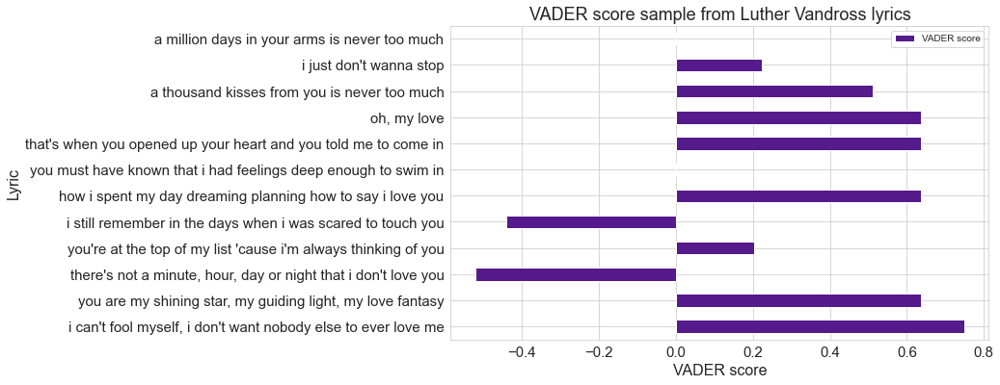

In [20]:
# sample for Luther/VADER
LV1 = {}
for sentence in artists_lyrics['Luther Vandross']['VADER'][:14]:
    LV1[sentence]=analyzer.polarity_scores(sentence)['compound']
LV1_df = pd.DataFrame.from_dict(LV1, orient = 'index', columns=['VADER score'])
LV1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Luther Vandross lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [21]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Luther Vandross']['LabMT']).most_common(10)

LV2 = pd.DataFrame(columns=["count", "LabMT score"])


for word, number in top10:
    LV2.loc[word] = [number , LabMTwordsentiment[word]]

LV2 = LV2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
LV2

,count,LabMT score
love,314,8.42
one,108,5.40
yeah,67,5.90
oh,54,4.84
know,41,6.10
get,38,5.92
time,38,5.74
take,37,5.18
never,35,3.34
power,35,6.68


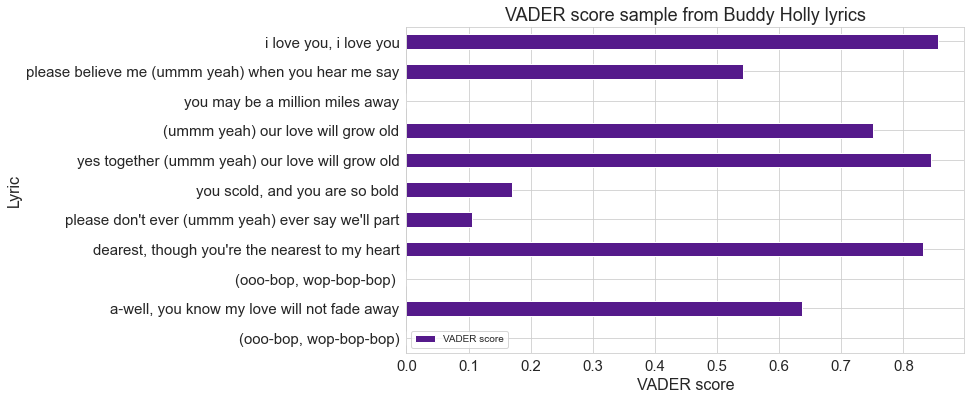

In [22]:
# Buddy Holly/VADER sample
BH1 = {}
for sentence in artists_lyrics['Buddy Holly']['VADER'][230:249]:
    BH1[sentence]=analyzer.polarity_scores(sentence)['compound']
BH1_df = pd.DataFrame.from_dict(BH1, orient = 'index', columns=['VADER score'])
BH1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Buddy Holly lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [23]:
# now check LabMT data ## use 11 for top10 since 1 isn't in the keys
top10 = FreqDist(artists_lyrics['Buddy Holly']['LabMT']).most_common(11)

BH2 = pd.DataFrame(columns=["count", "LabMT score"])


for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    BH2.loc[word] = [number , LabMTwordsentiment[word]]

BH2 = BH2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
BH2

,count,LabMT score
bop,108,5.31
love,103,8.42
well,47,6.68
mm,40,5.04
oh,39,4.84
ooo,36,5.08
know,34,6.10
day,32,6.24
going,32,5.42
peggy,30,5.30


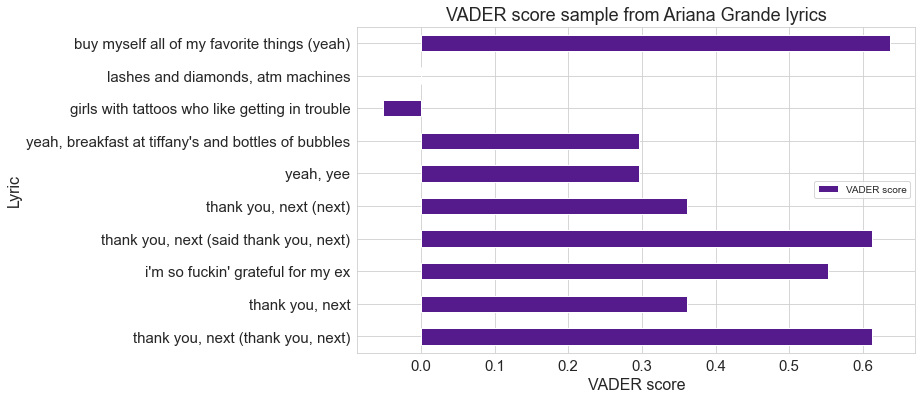

In [24]:
# Ariana Grande/VADER sample
AG1 = {}
for sentence in artists_lyrics['Ariana Grande']['VADER'][70:90]:
    AG1[sentence]=analyzer.polarity_scores(sentence)['compound']
AG1_df = pd.DataFrame.from_dict(AG1, orient = 'index', columns=['VADER score'])
AG1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Ariana Grande lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [25]:
# now check LabMT data ## use 11 for her since 'ayy' is not in the LabMT lexicon
top10 = FreqDist(artists_lyrics['Ariana Grande']['LabMT']).most_common(11)

Ari2 = pd.DataFrame(columns=["count", "LabMT score"])


for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    Ari2.loc[word] = [number , LabMTwordsentiment[word]]

Ari2 = Ari2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
Ari2

,count,LabMT score
yeah,206,5.90
know,87,6.10
like,85,7.22
love,78,8.42
oh,70,4.84
got,62,5.60
bout,53,4.56
next,46,5.62
boy,46,6.24
keep,46,5.86


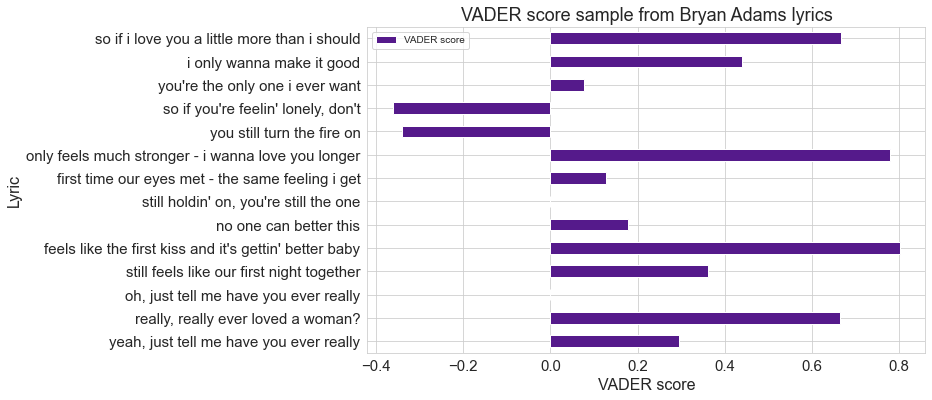

In [26]:
# Bryan Adams/VADER sample
BA1 = {}
for sentence in artists_lyrics['Bryan Adams']['VADER'][200:215]:
    BA1[sentence]=analyzer.polarity_scores(sentence)['compound']
BA1_df = pd.DataFrame.from_dict(BA1, orient = 'index', columns=['VADER score'])
BA1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Bryan Adams lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [27]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Bryan Adams']['LabMT']).most_common(10)

BA2 = pd.DataFrame(columns=["count", "LabMT score"])


for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    BA2.loc[word] = [number , LabMTwordsentiment[word]]

BA2 = BA2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
BA2

,count,LabMT score
love,81,8.42
yeah,63,5.90
know,56,6.10
oh,54,4.84
really,51,5.84
light,50,6.40
shine,47,7.14
one,45,5.40
tell,39,5.42
gonna,38,4.86


**And let's check the least positive artists.**

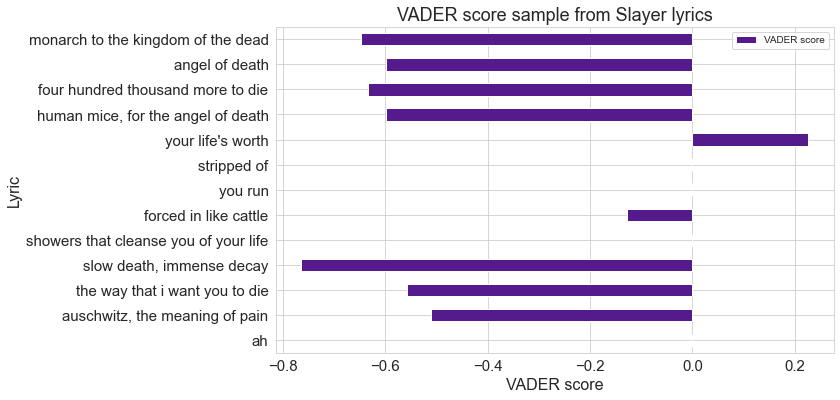

In [28]:
# Slayer/VADER sample
Slayer1 = {}
for sentence in artists_lyrics['Slayer']['VADER'][:13]:
    Slayer1[sentence]=analyzer.polarity_scores(sentence)['compound']
Slayer1_df = pd.DataFrame.from_dict(Slayer1, orient = 'index', columns=['VADER score'])
Slayer1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Slayer lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [29]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Slayer']['LabMT']).most_common(10)

Slayer2 = pd.DataFrame(columns=["count", "LabMT score"])


for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    Slayer2.loc[word] = [number , LabMTwordsentiment[word]]

Slayer2 = Slayer2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
Slayer2

,count,LabMT score
death,51,1.54
god,38,7.28
blood,32,3.82
life,30,7.32
war,27,1.80
soul,26,6.34
dead,25,2.00
eye,22,6.14
die,20,1.74
mind,20,6.04


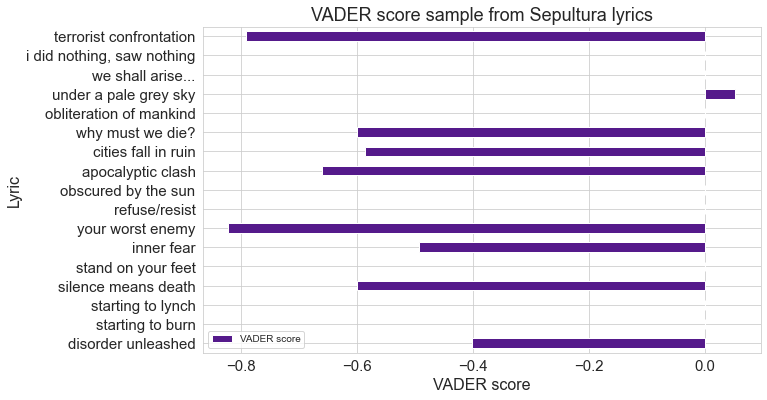

In [30]:
# Sepultura/VADER
Sepultura1 = {}
for sentence in artists_lyrics['Sepultura']['VADER'][100:118]:
    Sepultura1[sentence]=analyzer.polarity_scores(sentence)['compound']
Sepultura1_df = pd.DataFrame.from_dict(Sepultura1, orient = 'index', columns=['VADER score'])
Sepultura1_df.plot.barh(color = '#551A8B', fontsize=15,  figsize=(10,6))
plt.title('VADER score sample from Sepultura lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [31]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Sepultura']['LabMT']).most_common(11)

Sepultura2 = pd.DataFrame(columns=["count", "LabMT score"])

for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    Sepultura2.loc[word] = [number , LabMTwordsentiment[word]]

Sepultura2 = Sepultura2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
Sepultura2

,count,LabMT score
cut,20,3.42
life,19,7.32
throat,19,5.00
hello,17,7.00
way,17,5.24
uh,16,4.20
root,16,5.80
take,16,5.18
world,16,6.52
lie,14,2.60


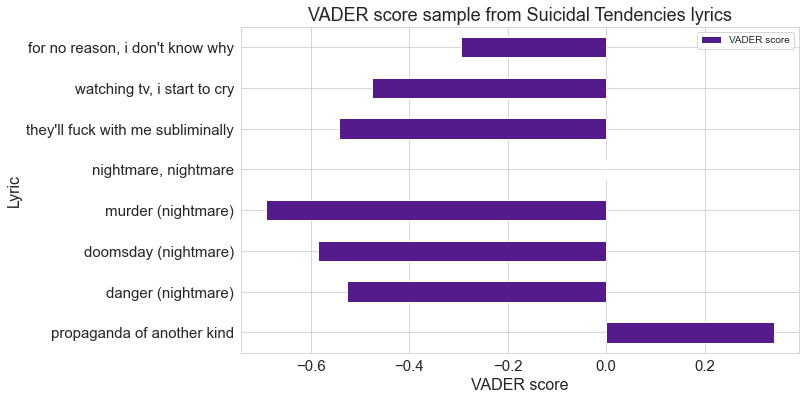

In [32]:
# Suicidal Tendencies/VADER sample
ST1 = {}
for sentence in artists_lyrics['Suicidal Tendencies']['VADER'][105:120]:
    ST1[sentence]=analyzer.polarity_scores(sentence)['compound']
ST1_df = pd.DataFrame.from_dict(ST1, orient = 'index', columns=['VADER score'])
ST1_df.plot.barh(color = '#551A8B', fontsize=15,  figsize=(10,6))
plt.title('VADER score sample from Suicidal Tendencies lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [33]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Suicidal Tendencies']['LabMT']).most_common(10)

ST2 = pd.DataFrame(columns=["count", "LabMT score"])

for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    ST2.loc[word] = [number , LabMTwordsentiment[word]]

ST2 = ST2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
ST2

,count,LabMT score
head,53,5.96
bring,53,5.30
inside,47,5.40
want,35,5.70
war,35,1.80
trip,35,7.00
pain,34,2.10
go,33,5.54
get,32,5.92
like,32,7.22


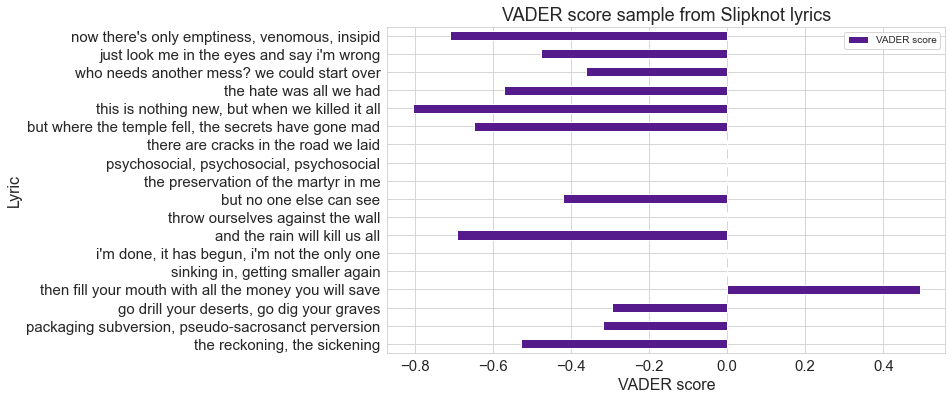

In [34]:
# Slipknot/VADER sample
Slipknot1 = {}
for sentence in artists_lyrics['Slipknot']['VADER'][40:59]:
    Slipknot1[sentence]=analyzer.polarity_scores(sentence)['compound']
Slipknot1_df = pd.DataFrame.from_dict(Slipknot1, orient = 'index', columns=['VADER score'])
Slipknot1_df.plot.barh(color = '#551A8B', fontsize=15, figsize=(10,6))
plt.title('VADER score sample from Slipknot lyrics',fontsize=18)
plt.xlabel('VADER score', fontsize=16)
plt.ylabel('Lyric', fontsize=16)
plt.show()

In [35]:
# now check LabMT data
top10 = FreqDist(artists_lyrics['Slipknot']['LabMT']).most_common(10)

Slipknot2 = pd.DataFrame(columns=["count", "LabMT score"])

for word, number in top10:
    if word not in LabMTwordsentiment.keys():
        continue
    Slipknot2.loc[word] = [number , LabMTwordsentiment[word]]

Slipknot2 = Slipknot2.style.format({
    'count': '{:,.0f}'.format,
    'LabMT score': '{:,.2f}'.format,})
Slipknot2

,count,LabMT score
fuck,86,4.14
cut,63,3.42
inside,62,5.40
one,48,5.40
see,47,6.06
let,45,5.38
like,35,7.22
never,35,3.34
people,35,6.16
shit,34,2.50


**We review the distribution of positive, negative, and neutral sentences with VADER**

Below, we display the top 10 sad, top 10 happy, top 10 neutral distributions of lyrics. We look through each sentence of each artist's lyrics txt file and assign it value of positive, negative, or neutral, depending on the VADER compound score. If the score is >= 0.4, we assign it as positive. If the score is <= -0.4, we assign it as negative. In between 0.4 and -0.4 is assigned as neutral. We remove the artists that have over 20% of unrecognizable tokens by LabMT.

These plots show us similar results than the top LabMT/VADER sentiment analysis also showed us. The most positive artists also show the highest proportion of happiest sentences, which makes sense. The least happy artists appear to have the highest distributions of negative sentences as well. The most neutral artists might be a good list to look through for choosing safe songs that won't cause too much emotional impact. An important note is that this graph just classifies sentences into groups of positive, negative, and neutral - so a sentence with a score of 0.4 has the same result as a sentence with 0.9.



In [36]:
# use VADER to analyse if a given sentence is positive, neutral, or negative
# create dataframe for easier plotting
df = pd.DataFrame(columns=('artist', 'pos', 'neu', 'neg'))
sid = SentimentIntensityAnalyzer()
i=0

folder='./Lyrics/'
file_names = sorted(os.listdir(folder))

for file_name in file_names:
    if file_name[-4:]!=".txt": # ignore the weird files
            continue
    artist = file_name[:-4]
    artist = re.sub("_", " ", artist)
    if artist in artist_removal:
        continue
    f = open(folder + file_name, 'rb')
    num_positive = 0
    num_negative = 0
    num_neutral = 0
    
    # check each sentence score
    for sentence in f.readlines():
        this_sentence = sentence.decode('utf-8')
        comp = sid.polarity_scores(this_sentence)
        comp = comp['compound']
        if comp >= 0.4:
            num_positive += 1
        elif comp > -0.4 and comp < 0.4:
            num_neutral += 1
        else:
            num_negative += 1
   
    num_total = num_negative + num_neutral + num_positive
    if num_total > 0:
        percent_negative = (num_negative/float(num_total))*100
        percent_neutral = (num_neutral/float(num_total))*100
        percent_positive = (num_positive/float(num_total))*100
        df.loc[i] = (artist, percent_positive, percent_neutral, percent_negative)
    i+=1

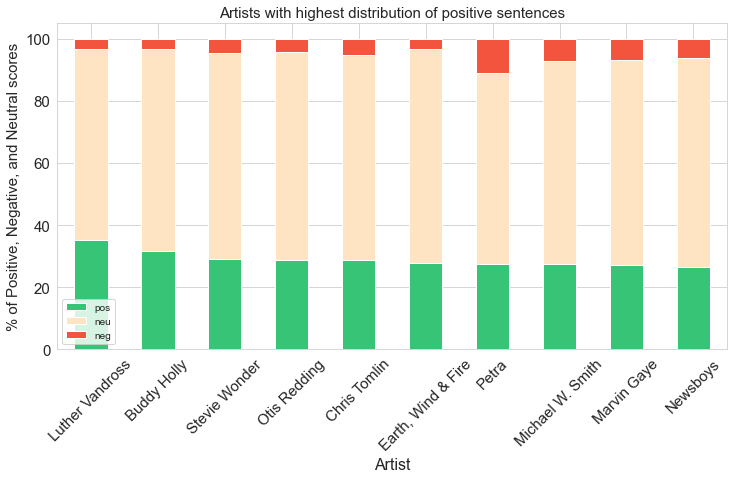

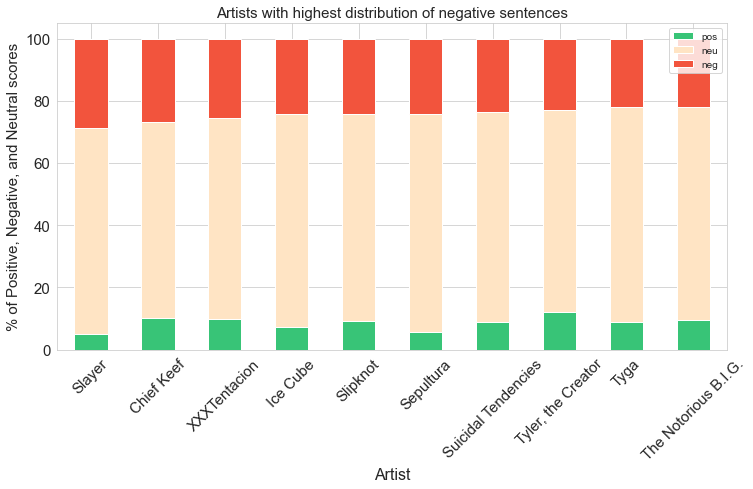

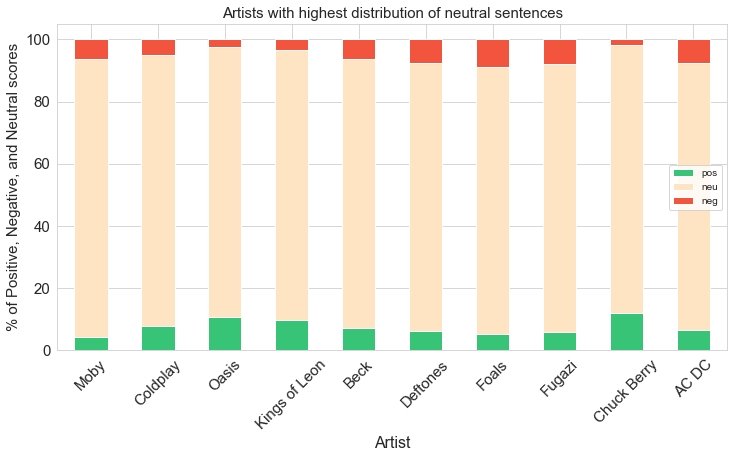

In [37]:
# sns.set()
# show top pos, neg, and neu artist distributions
dfpos = df.nlargest(10,'pos')
dfneg = df.nlargest(10,'neg')
dfneu = df.nlargest(10,'neu')

color = {"pos": "#38C477", "neg": "#F2543D", "neu": "#FFE4C4"}

dfpos.plot.bar(x='artist', stacked=True, rot=45,color=color, fontsize=15)
plt.title('Artists with highest distribution of positive sentences',fontsize=15)
plt.xlabel('Artist', fontsize=16)
plt.ylabel('% of Positive, Negative, and Neutral scores', fontsize=15)
plt.show()          

dfneg.plot.bar(x='artist', stacked=True, rot=45, color=color, fontsize=15)
plt.title('Artists with highest distribution of negative sentences',fontsize=15)
plt.xlabel('Artist', fontsize=16)
plt.ylabel('% of Positive, Negative, and Neutral scores', fontsize=15)
plt.show()    

dfneu.plot.bar(x='artist', stacked=True, rot=45, color=color, fontsize=15)
plt.title('Artists with highest distribution of neutral sentences',fontsize=15)
plt.xlabel('Artist', fontsize=16)
plt.ylabel('% of Positive, Negative, and Neutral scores', fontsize=15)
plt.show()    

**Sentiment Analysis on genres:**
1. Next we wanted to perform sentiment analysis on genres
2. We decided to only perform analysis on the top 25 most occurring genres from the list of 397 artists in our Lyric dataset. Each artist can have more than one genre - so their lyrics can be counted for more than one genre.

**We begin by identifying the list of top 25 occurring genres and creating dictionaries to store the genre, artists combination, then genre, popularity combination.**

In [38]:
# create dict of artist, genres from the artist dataframe
genres_dict = pd.Series(artist_90deg_df['genres_cleaned'].values,index=artist_90deg_df['index']).to_dict()

# dict of genre, artists
genres_dict_rev = {}
for k, genres in genres_dict.items():
    for genre in genres:
        if genre in genres_dict_rev.keys():
            genres_dict_rev[genre] += [k]
        else:
            genres_dict_rev[genre] = [k]


# dict for genre, popularity
genre_pop = {}
for g, artists in genres_dict_rev.items():
    genre_pop[g] = len(artists)
    

# sort genre popularity by most popular
sorted_genres = sorted(genre_pop.items(), key=lambda kv: kv[1], reverse=True)

# only look at top 25 genres
genres_top_25 = sorted_genres[:25]

# lists for genres kept
genres_kept_list = [x[0] for x in genres_top_25]

**Below we see the distribution among artists inside those 25 genres**

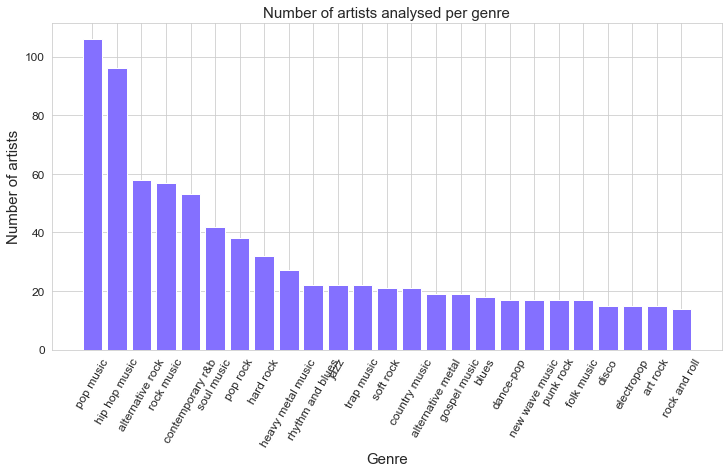

In [39]:
plt.bar((*zip(*genres_top_25)), color='#8470FF')
plt.title('Number of artists analysed per genre', fontsize=15)
plt.xlabel('Genre', fontsize=15)
plt.ylabel('Number of artists', fontsize=15)
plt.xticks(rotation=60, fontsize=12)
plt.yticks(fontsize=12)
plt.show()

**Calculate sentiment for the genres now. We do not consider the list of artists that have >20% unrecogniseable tokens by LabMT. We store the average sentiments and the standard deviations.**

In [40]:
# dictionaries
genre_sentiment_labmt = {g:[] for g in genres_kept_list}
genre_sentiment_vader = {g:[] for g in genres_kept_list}
genre_avg_sentiment_labmt = {}
genre_std_sentiment_labmt = {}
genre_avg_sentiment_vader = {}
genre_std_sentiment_vader = {}

# store the sentiments
for artist in artist_sentiment_list:
    artist_aka = artist
    if artist == "AC DC":
        artist_aka = "AC/DC"
    for genre in genres_dict[artist_aka]:
        if genre in genre_sentiment_labmt.keys():
            genre_sentiment_labmt[genre] += [sentiment_labmt[artist]]
            genre_sentiment_vader[genre] += [sentiment_vader[artist]]
for genre, list_score in genre_sentiment_labmt.items():
    genre_avg_sentiment_labmt[genre] = np.mean(list_score)
    genre_std_sentiment_labmt[genre] = np.std(list_score)
for genre, list_score in genre_sentiment_vader.items():
    genre_avg_sentiment_vader[genre] = np.mean(list_score)
    genre_std_sentiment_vader[genre] = np.std(list_score)
    
# order the sentiment scores
genre_avg_sentiment_labmt_sorted = sorted(genre_avg_sentiment_labmt.items(), key= lambda x: x[1], reverse=True)
genre_avg_sentiment_vader_sorted = sorted(genre_avg_sentiment_vader.items(), key= lambda x: x[1], reverse=True)

**We display the most and least positive genres in a table for easier viewing.**

In [41]:
# show happiest table
genre_avg_sentiment_happiest = [(x[0],x[1], ' ', y[0],y[1]) for x,y  in \
                             zip(genre_avg_sentiment_labmt_sorted[:10], genre_avg_sentiment_vader_sorted[:10])]
print('10 Genres with happiest lyrics:\n'+ tabulate(genre_avg_sentiment_happiest,
               headers=['Genre', 'LabMT', ' ', 'Genre', 'VADER'],
               showindex=range(1,11), tablefmt="fancy_grid"))

10 Genres with happiest lyrics:
╒════╤══════════════════╤═════════╤═════╤══════════════════╤═══════════╕
│    │ Genre            │   LabMT │     │ Genre            │     VADER │
╞════╪══════════════════╪═════════╪═════╪══════════════════╪═══════════╡
│  1 │ rhythm and blues │ 5.76192 │     │ rhythm and blues │ 0.108569  │
├────┼──────────────────┼─────────┼─────┼──────────────────┼───────────┤
│  2 │ disco            │ 5.73169 │     │ disco            │ 0.108206  │
├────┼──────────────────┼─────────┼─────┼──────────────────┼───────────┤
│  3 │ soul music       │ 5.72812 │     │ soul music       │ 0.103591  │
├────┼──────────────────┼─────────┼─────┼──────────────────┼───────────┤
│  4 │ jazz             │ 5.71788 │     │ soft rock        │ 0.0921045 │
├────┼──────────────────┼─────────┼─────┼──────────────────┼───────────┤
│  5 │ gospel music     │ 5.71156 │     │ gospel music     │ 0.0870871 │
├────┼──────────────────┼─────────┼─────┼──────────────────┼───────────┤
│  6 │ soft rock   

In [42]:
# saddest genres 
genres_sentiment_saddest = [(x[0],x[1], ' ', y[0],y[1]) for x,y in \
                     zip(genre_avg_sentiment_labmt_sorted[-10:], genre_avg_sentiment_vader_sorted[-10:])]

print('10 genres with saddest lyrics (n°1 being the saddest):\n'\
    + tabulate(genres_sentiment_saddest,
               headers=['Genre', 'LabMT', ' ', 'Genre', 'VADER'],
               showindex=reversed(range(1,11)), tablefmt="fancy_grid"))

10 genres with saddest lyrics (n°1 being the saddest):
╒════╤═══════════════════╤═════════╤═════╤═══════════════════╤═════════════╕
│    │ Genre             │   LabMT │     │ Genre             │       VADER │
╞════╪═══════════════════╪═════════╪═════╪═══════════════════╪═════════════╡
│ 10 │ dance-pop         │ 5.58282 │     │ electropop        │  0.0584261  │
├────┼───────────────────┼─────────┼─────┼───────────────────┼─────────────┤
│  9 │ new wave music    │ 5.57296 │     │ new wave music    │  0.0414487  │
├────┼───────────────────┼─────────┼─────┼───────────────────┼─────────────┤
│  8 │ electropop        │ 5.53833 │     │ hard rock         │  0.0351526  │
├────┼───────────────────┼─────────┼─────┼───────────────────┼─────────────┤
│  7 │ hard rock         │ 5.51978 │     │ art rock          │  0.0296441  │
├────┼───────────────────┼─────────┼─────┼───────────────────┼─────────────┤
│  6 │ alternative rock  │ 5.5044  │     │ alternative rock  │  0.0283887  │
├────┼───────────────

**Now show the average and standard deviation of the genres sentiment using error bars.**

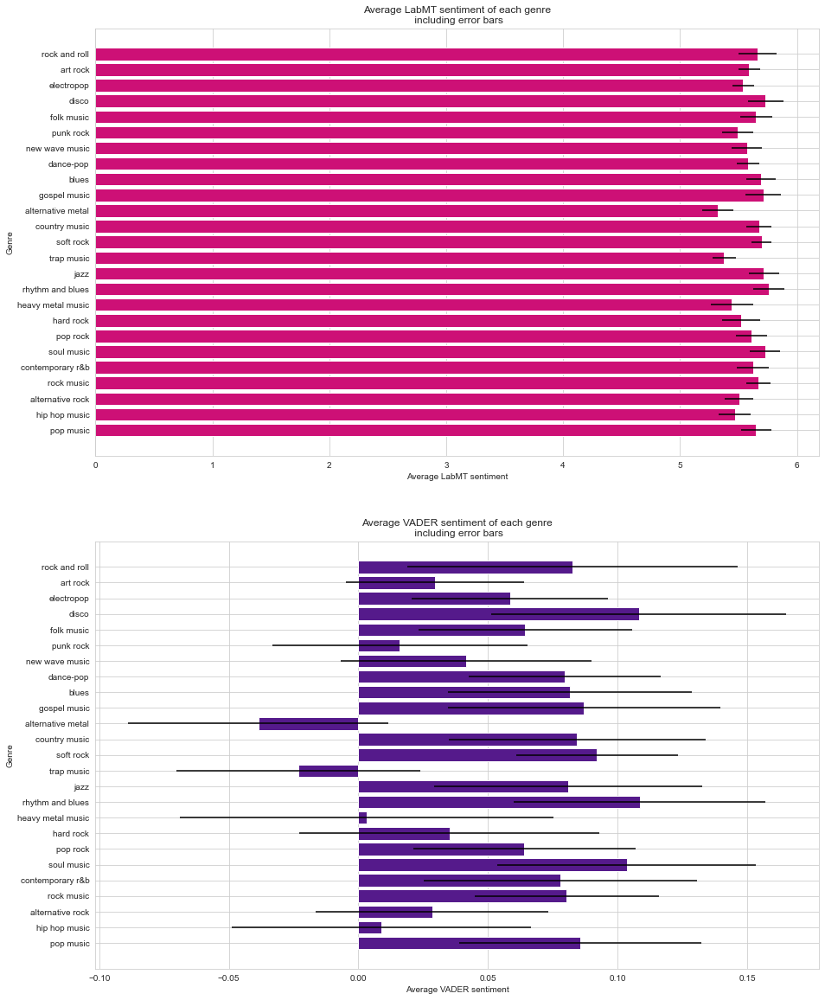

In [43]:
fig, axes = plt.subplots(2, 1, figsize=(15,20))

axes[0].barh(y=list(genre_avg_sentiment_labmt.keys()),
            width=genre_avg_sentiment_labmt.values(),
            xerr=genre_std_sentiment_labmt.values(),
            color='#CD1076')
axes[0].set(ylabel='Genre',
            xlabel='Average LabMT sentiment',
            title='Average LabMT sentiment of each genre\n including error bars')

axes[1].barh(y=list(genre_avg_sentiment_vader.keys()),
            width=genre_avg_sentiment_vader.values(),
            xerr=genre_std_sentiment_vader.values(),color='#551A8B')
axes[1].set(ylabel='Genre',
            xlabel='Average VADER sentiment',
            title='Average VADER sentiment of each genre\n including error bars')

plt.show()

**Now we repeat these steps for communities. We load and identify the artists from our list of 397 and their associated community. Then we calculate the average and standard deviation of LabMT and VADER sentiment scores.**

In [44]:
# import communities in the right format from the network creation
with open('gcc_communities_artists.json') as f:
    comm_artists = json.load(f)
    
# Name each community by its three most connected artists, and get their degree distribution
communities_name = {}
communities_degrees = {}
for c, list_artists in comm_artists.items():
    artists_deg = {}
    commu_in_degrees, commu_out_degrees = [], []
    for n in list_artists:
        artists_deg[n] = GCC.degree(n)
        commu_in_degrees += [GCC.in_degree(n)]
        commu_out_degrees += [GCC.out_degree(n)]
    # We made sure to check that all communities had at least 3 nodes
    top3 = sorted(artists_deg.items(), key= lambda x: x[1], reverse=True)[:3]
    name = top3[0][0] + '-' + top3[1][0] + '-' + top3[2][0]
    communities_name[c] = name
    communities_degrees[c] = {'in':commu_in_degrees, 'out':commu_out_degrees}
    
# initialize dictionaries to store the average and standard deviation for both methods
comm_sentiment_labmt = {c:[] for c in comm_artists.keys()}
comm_sentiment_vader = {c:[] for c in comm_artists.keys()}
comm_avg_sentiment_labmt = {}
comm_std_sentiment_labmt = {}
comm_avg_sentiment_vader = {}
comm_std_sentiment_vader = {}

# store the sentiments
for comm, artists in comm_artists.items():
    for artist in artists:
        if artist not in artist_sentiment_list:
            continue
        if artist in sentiment_labmt.keys():
            comm_sentiment_labmt[comm] += [sentiment_labmt[artist]]
        if artist in sentiment_vader.keys():
            comm_sentiment_vader[comm] += [sentiment_vader[artist]]
    
#     comm_name = communities_name[commu]
    if len(comm_sentiment_labmt[comm]) == 0:
        continue # skip communities without any lyrics
    else:
        comm_avg_sentiment_labmt[comm] = np.mean(comm_sentiment_labmt[comm])
        comm_std_sentiment_labmt[comm] = np.std(comm_sentiment_labmt[comm])
        comm_avg_sentiment_vader[comm] = np.mean(comm_sentiment_vader[comm])
        comm_std_sentiment_vader[comm] = np.std(comm_sentiment_vader[comm])

<ipython-input-45-d1fcc6a9d913>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(communities_name_sent.values())


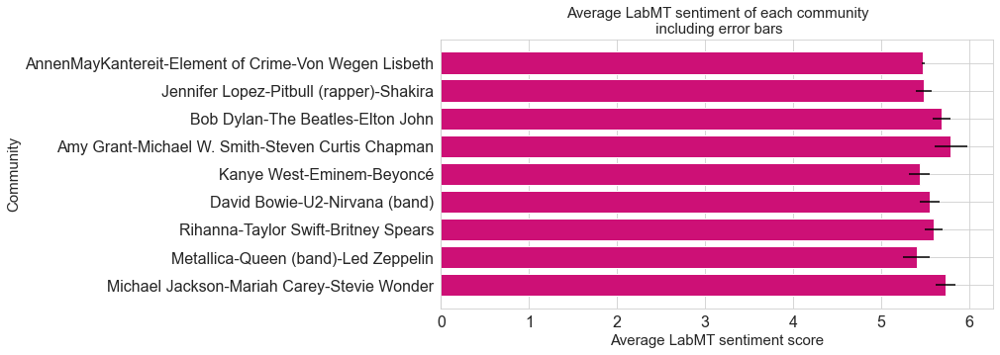

<ipython-input-45-d1fcc6a9d913>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(communities_name_sent.values())


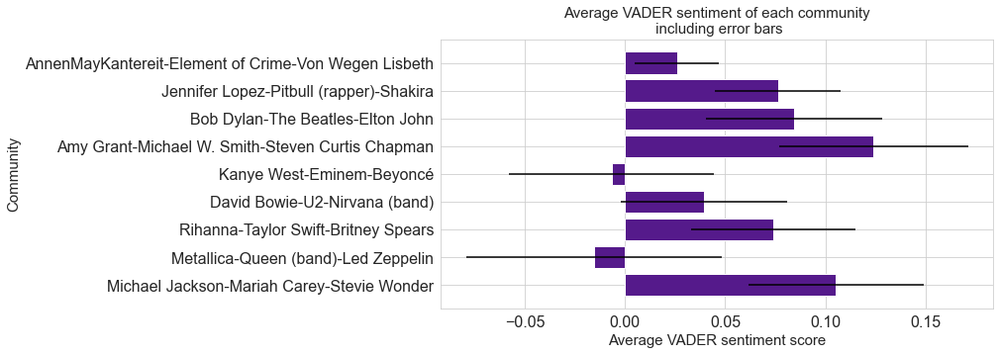

In [45]:
# make list of names for sentiment graph
communities_name_sent = communities_name.copy()
comm_to_remove = ['6','7','8','9','10','12','13','15','16','17']
for key in comm_to_remove:
    del communities_name_sent[key]

# Create a histogram of all artist's associated sentiments for LabMT, VADER, and TextBlob
fig, ax = plt.subplots(figsize=(10, 5))
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

ax.barh(y=list(comm_avg_sentiment_labmt.keys()),
            width=comm_avg_sentiment_labmt.values(),
            xerr=comm_std_sentiment_labmt.values(),
            color='#CD1076')
ax.set_title('Average LabMT sentiment of each community\n including error bars', size=15) # Title
ax.set_ylabel('Community', fontsize = 15) # Y label
ax.set_xlabel('Average LabMT sentiment score', fontsize = 15) # X label
ax.set_yticklabels(communities_name_sent.values())
plt.show()


fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(y=list(comm_avg_sentiment_vader.keys()),
            width=comm_avg_sentiment_vader.values(),
            xerr=comm_std_sentiment_vader.values(),color='#551A8B')
ax.set_title('Average VADER sentiment of each community\n including error bars', size=15) # Title
ax.set_ylabel('Community', fontsize = 15) # Y label
ax.set_xlabel('Average VADER sentiment score', fontsize = 15) # X label
ax.set_yticklabels(communities_name_sent.values())
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

**We analyse the number of artists that are in each community (for the sentiment analysis portion).**

In [46]:
comm_kept_list = ['0','1','2','3','4','5','11','14','16','18']
# dict for the list of files for each comm
comm_artists_condensed = {comm:[] for comm in comm_kept_list}
for comm, artists in comm_artists.items():
    # only look at genres in the kept list
    if comm not in comm_kept_list:
        continue
    for artist in artists:
        if artist not in full_artist_list: 
            continue
        if artist == "AC/DC":
            artist = "AC_DC"
        artist = artist.replace('_', ' ')
        comm_artists_condensed[comm] += [artist]

comm_pop = {k:len(v) for k, v in comm_artists_condensed.items()}

In [47]:
# table to remind users what the community names are
comm_sent_name_table = pd.DataFrame.from_dict(communities_name, orient='index').rename(columns={0:'Community Name' })
comm_sent_name_table = comm_sent_name_table.drop(['6','7','8','9','10','12','13','15','17'], axis=0)
pd.set_option('display.max_colwidth', None)
comm_sent_name_table

,Community Name
0,Michael Jackson-Mariah Carey-Stevie Wonder
1,Metallica-Queen (band)-Led Zeppelin
2,Rihanna-Taylor Swift-Britney Spears
3,David Bowie-U2-Nirvana (band)
4,Kanye West-Eminem-Beyoncé
5,Amy Grant-Michael W. Smith-Steven Curtis Chapman
11,Bob Dylan-The Beatles-Elton John
14,Jennifer Lopez-Pitbull (rapper)-Shakira
16,Booba-Gims-Dadju
18,AnnenMayKantereit-Element of Crime-Von Wegen Lisbeth


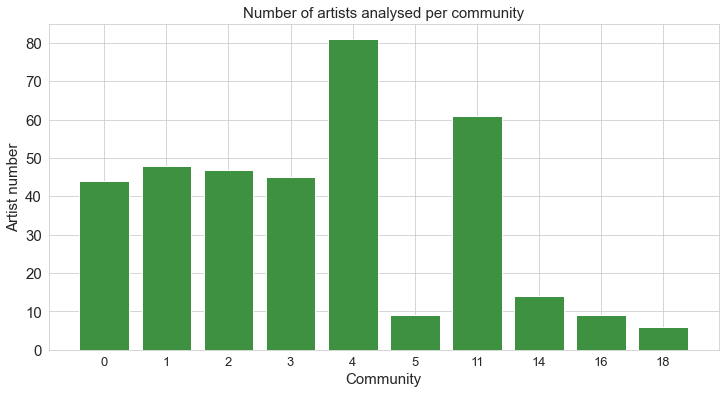

In [48]:
plt.bar(comm_pop.keys(),comm_pop.values(), color='#3D9140')
plt.title('Number of artists analysed per community', fontsize=15)
plt.xlabel('Community', fontsize=15)
plt.ylabel('Artist number', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=15)
plt.show()

## Corpus creation

**Finally we move on to creating a corpus of documents for artists, genres, and communities individually, so that we can perform TC-IDF and create wordclouds.**

**First we create a corpus based on the 397 artist txt files**

In [49]:
# make a corpus based on txt files for each artist
lyrics = {}
corpus_root = './Lyrics/'

file_names = sorted(os.listdir(corpus_root))

for file_name in file_names:
    if file_name[-4:]!=".txt": # ignore the weird files
            continue
    corpus = PlaintextCorpusReader(corpus_root,file_name)
    artist = file_name[:-4]
    artist = re.sub("_", " ", artist)
    lyrics[artist] = nltk.Text(corpus.words())

**Next we create a corpus for our 25 genres using a dictionary we made earlier to store the genre and each associated artist.**

In [50]:
# dict for the list of files for each genre
genres_filenames = {genre:[] for genre in genres_kept_list}
for genre, artists in genres_dict_rev.items():
    # only look at genres in the kept list
    if genre not in genres_kept_list: # top 25 genres to review
        continue
    for artist in artists:
        if artist == "AC/DC":
            artist = "AC_DC"
        artist = artist.replace(' ', '_')
        genres_filenames[genre] += [artist+'.txt']

# create the corpus
genres_text={}
corpus_root = './Lyrics/'
for genre, file_names in genres_filenames.items():
    corpus = PlaintextCorpusReader(corpus_root, file_names)
    genres_text[genre] = nltk.Text(corpus.words())

**Finally we create a corpus for our 10 communities using a dictionary we made earlier to store the community and each associated artist.**

In [51]:
# list of comms is in comms_kept_list 
comm_kept_list = ['0','1','2','3','4','5','11','14','16','18']
# dict for the list of files for each comm
comm_filenames = {comm:[] for comm in comm_kept_list}
for comm, artists in comm_artists.items():
    if comm not in comm_kept_list:
        continue
    for artist in artists:
        if artist not in full_artist_list: 
            continue
        if artist == "AC/DC":
            artist = "AC_DC"
        artist = artist.replace(' ', '_')
        comm_filenames[comm] += [artist+'.txt']

# create the corpus
comm_text={}
corpus_root = './Lyrics/'
for comm, file_names in comm_filenames.items():
    corpus = PlaintextCorpusReader(corpus_root, file_names)
    comm_text[comm] = nltk.Text(corpus.words())

## TC-IDF - 
We design functions to compute the TC, IDF and TC-IDF of a text or set of documents based on the formulas given by [Wikipedia](https://en.wikipedia.org/wiki/Tf%E2%80%93idf)
$$ TC(t,d) = f_{t,d} \text{ where } f_{t,d} \text{ is the raw count of term } t \text{ in document } d $$ 


In [52]:
# function to compute the TC (term count) for a given text
def compute_TC(text):
    tc = {w:text.count(w) for w in set(text)}
    return tc

$$ IDF(t,D) = \log \frac{N}{|\{d \in D : t \in d\}|}$$
$ \text{ where } N \text{ is the total number of documents in the corpus} \\ \text{ and }|\{d \in D : t \in d\}| \text{ is the number of documents where the term } t \text{ appears } $ 

In [53]:
# function to compute the IDF (inverse document frequency) of a given set of documents
def compute_IDF(documents):
    idf = {}
    N = len(documents)
    for text in documents:
        for w in set(text):
            if w in idf.keys():
                continue
            denominator = 0
            for doc in documents:
                if doc.count(w) != 0:
                    denominator += 1
            idf[w] = np.log(N / denominator)
    return idf

$$ \text{TC-IDF}(t,d,D) = TC(t,d) \cdot IDF(t,D)$$ 

In [54]:
# function to compute the TC-IDF
def compute_TC_IDF(doc_tc, idf): #NB: can also be used to compute TF-IDF
    tc_idf = {}
    for doc, tc in doc_tc.items():
        tc_idf[doc] = {}
        for w in tc.keys():
            tc_idf[doc][w] = tc[w] * idf[w]
    return tc_idf

# WARNING This takes many hours to run for artists, genres, and communities. We suggest loading the presaved scores, so we have commented out the code that runs the calculations. ##

**Either load the pre-saved TC, IDF, and TC-IDF scores for artists, or run the whole calculation (takes hours)**

In [55]:
# import the artists tc, idf, and tc-idf scores
with open('artists_tc.json') as f:
    artists_tc = json.load(f)
with open('artists_idf.json') as f:
    artists_idf = json.load(f)
with open('artists_tc_idf.json') as f:
    artists_tc_idf = json.load(f)

## COMMENT OUT FOR NOW BECAUSE IT TAKES HOURS ##
# calculate the TC, IDF, and TC-IDF for each text using our defined functions
# artists_tc = {artist:compute_TC(text) for artist,text in lyrics.items()}
# artists_idf = compute_IDF(list(lyrics.values()))
# artists_tc_idf = compute_TC_IDF(artists_tc, artists_idf)

**Either load the pre-saved TC, IDF, and TC-IDF scores for genres, or run the whole calculation (takes hours)**

In [56]:
# import the genre tc, idf, and tc-idf scores
with open('genres_tc.json') as f:
    genres_tc = json.load(f)
with open('genres_idf.json') as f:
    genres_idf = json.load(f)
with open('genres_tc_idf.json') as f:
    genres_tc_idf = json.load(f)

## COMMENT OUT FOR NOW BECAUSE IT TAKES HOURS ##
# calculate the TC, IDF, and TC-IDF for each text using our defined functions
# genres_tc = {genre:compute_TC(text) for genre,text in genres_text.items()} 
# genres_idf = compute_IDF(list(genres_text.values()))
# genres_tc_idf = compute_TC_IDF(genres_tc, genres_idf)

**Either load the pre-saved TC, IDF, and TC-IDF scores for communities, or run the whole calculation (takes hours)**

In [57]:
# import the tc, idf, and tc-idf of communities
with open('comm_tc.json') as f:
    comm_tc = json.load(f)
with open('comm_idf.json') as f:
    comm_idf = json.load(f)
with open('comm_tc_idf.json') as f:
    comm_tc_idf = json.load(f)

## COMMENT OUT FOR NOW BECAUSE IT TAKES HOURS ##
# calculate the TC, IDF, and TC-IDF for each text using our defined functions
# comm_tc = {comm:compute_TC(text) for comm,text in comm_text.items()}
# comm_idf = compute_IDF(list(comm_text.values()))
# comm_tc_idf = compute_TC_IDF(comm_tc, comm_idf)

**Now that we have the TC-IDF scores for each artist, genre, and community, we can display them in wordclouds**

Some notes about our wordcloud generation:
1. We can adjust the minimum word length using min_word_length
2. We add an option to censor out bad/offensive words using censoring
3. We remove malformed contractions that occur during the tokenization.. (such as 'aren't' becoming 'aren', ''', and 't')
4. We added an image mask to some of them that had obvious fun images

In [58]:
# function to generate a wordcloud for a given artist and TC-IDF score
# adjust the background_color, mask, colormap, and min_word_length as needed
def create_wordcloud(artist, tc_idf, colormap='viridis', mask=None, background_color='white', min_word_length = 2,
                    censoring=False):
    # Create a single string with all words repeated according to TC-IDF
    bad_words = ['nigga', 'Nigga', 'Niggas', 'niggas'] # censoring
    malformed_words = ['aren','isn','didn'] # remove contractions that have been malformed during corpus creation
    single_string = ''
    for word in tc_idf.keys():
        if censoring and word in bad_words: # if censoring is on, we don't include the bad words
            continue
        if word in malformed_words:
            continue
        n_repeat = int(np.ceil(tc_idf[word]))
        for _ in range(n_repeat):
            single_string += ' '+word

    # Generate WordCloud
    wordcloud = WordCloud(background_color=background_color, collocations = False,
                          colormap=colormap, mask=mask, min_word_length = min_word_length,
                          width=1800, height=1400,
                         ).generate(single_string)
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(wordcloud)
    ax.axis('off')
    plt.show()

In [59]:
# use cool images
mask = {}
mask['country music'] = np.array(Image.open('./texas.jpeg'))
mask['5'] = 255 - np.array(Image.open('./cross.png'))
mask['gospel music'] = 255 - np.array(Image.open('./cross.png'))
mask['16'] = np.array(Image.open('./france.jpeg'))
mask['18'] = np.array(Image.open('./germany.jpeg'))
mask['disco'] = np.array(Image.open('./discoball.jpeg'))

### Artist wordclouds

**Now we show wordclouds for the top happiest artists**
1. **Do the top happiest artists tend to use mostly positive words?**


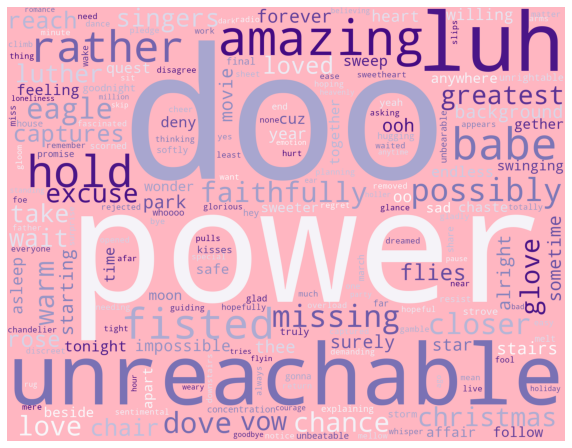

In [60]:
# generate the Luther Vandross wordcloud
create_wordcloud('Luther Vandross', artists_tc_idf['Luther Vandross'],colormap='Purples', 
                      background_color='#FFB6C1')

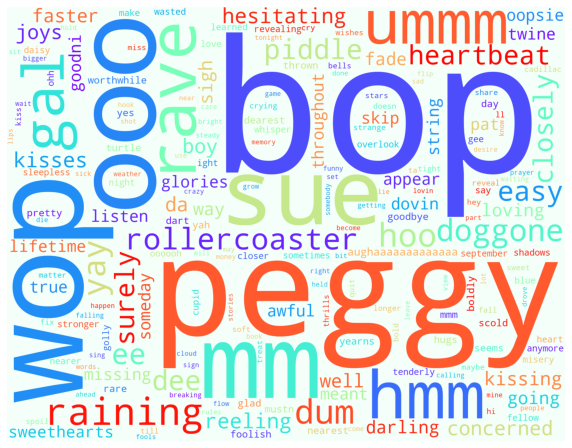

In [61]:
# generate the Buddy Holly wordcloud
create_wordcloud('Buddy Holly', artists_tc_idf['Buddy Holly'],colormap='rainbow', background_color='#F5FFFA')

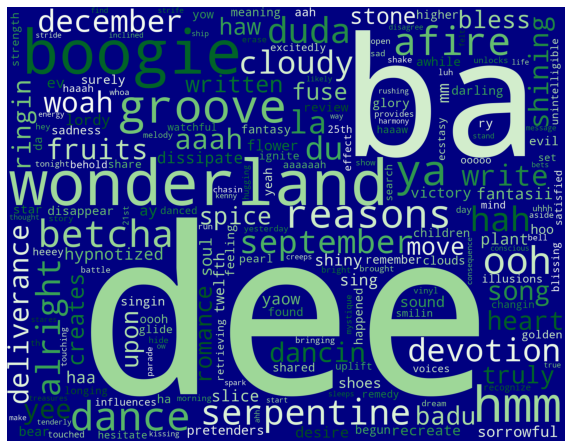

In [62]:
# generate the Earth, Wind & Fire wordcloud
create_wordcloud('Earth, Wind & Fire', artists_tc_idf['Earth, Wind & Fire'],colormap='Greens', background_color='#000080')

In [63]:
# why is 'ba' appearing??
lyrics['Earth, Wind & Fire'].concordance('ba')

Displaying 25 of 60 matches:
ight away , oh , yeah hey , hey , hey ba - dee - ya , say , do you remember ? 
 - dee - ya , say , do you remember ? ba - dee - ya , dancin ' in september ba
ba - dee - ya , dancin ' in september ba - dee - ya , never was a cloudy day b
a - dee - ya , never was a cloudy day ba - du - da , ba - du - da , ba - du - 
never was a cloudy day ba - du - da , ba - du - da , ba - du - da , ba - du ba
udy day ba - du - da , ba - du - da , ba - du - da , ba - du ba - du - da , ba
 - da , ba - du - da , ba - du - da , ba - du ba - du - da , ba - du , ba - du
ba - du - da , ba - du - da , ba - du ba - du - da , ba - du , ba - du - da , 
ba - du - da , ba - du ba - du - da , ba - du , ba - du - da , ba - du ba - du
da , ba - du ba - du - da , ba - du , ba - du - da , ba - du ba - du - da , ba
 - du - da , ba - du , ba - du - da , ba - du ba - du - da , ba - du , ba - du
da , ba - du , ba - du - da , ba - du ba - du - da , ba - du , ba - du - da my
ba - du - da , ba - du 

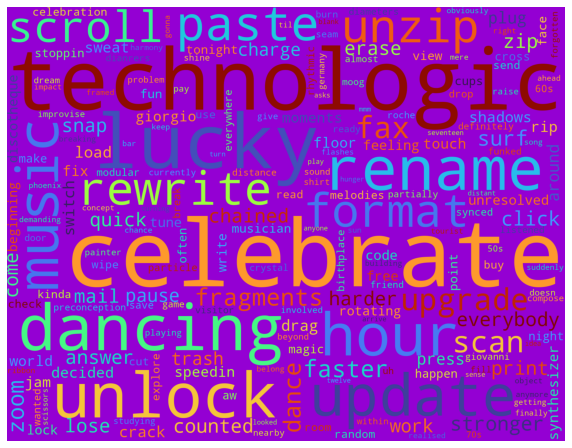

In [64]:
# generate the Daft Punk wordcloud
create_wordcloud('Daft Punk', artists_tc_idf['Daft Punk'],colormap = 'turbo', background_color='#9400D3')

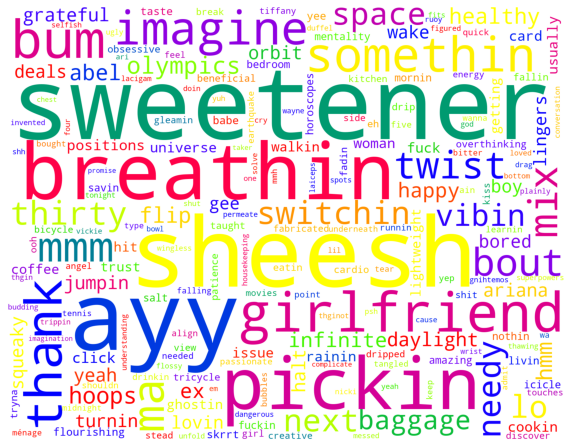

In [65]:
# generate the Ariana Grande wordcloud
create_wordcloud('Ariana Grande', artists_tc_idf['Ariana Grande'],colormap = 'prism', background_color='white')

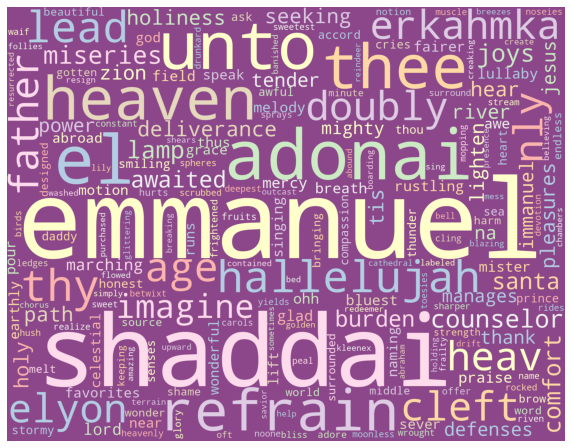

In [66]:
# generate the Amy Grant wordcloud
create_wordcloud('Amy Grant', artists_tc_idf['Amy Grant'],colormap = 'Pastel1', background_color='#8B4789')

**After seeing those happy wordclouds, let's see what the top words are for the least happy artists we identified above.**
1. **Do these artists tend to use more negative words?**

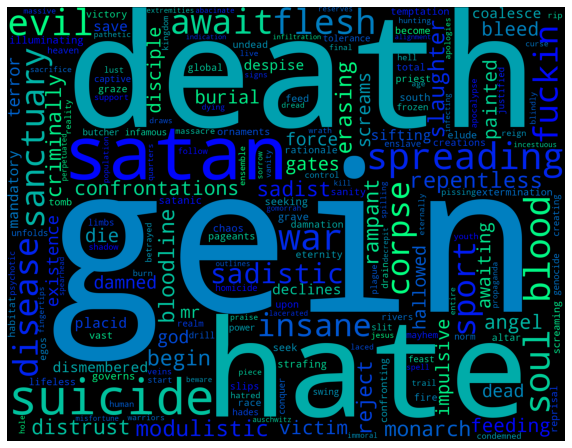

In [67]:
# generate the Slayer wordcloud 
create_wordcloud('Slayer', artists_tc_idf['Slayer'], colormap = 'winter', background_color='black')

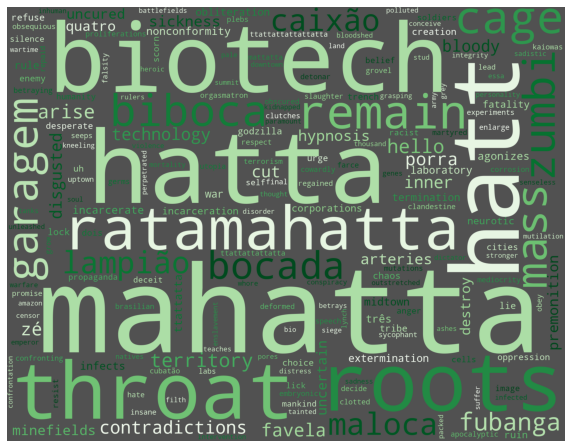

In [68]:
# generate the Sepultura wordcloud
create_wordcloud('Sepultura', artists_tc_idf['Sepultura'], colormap='Greens', background_color='#515151')

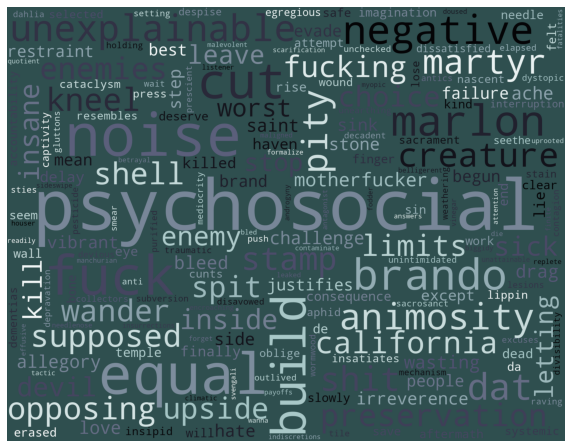

In [69]:
# generate the Slipknot wordcloud
create_wordcloud('Slipknot', artists_tc_idf['Slipknot'], background_color='#2F4F4F', colormap='bone')

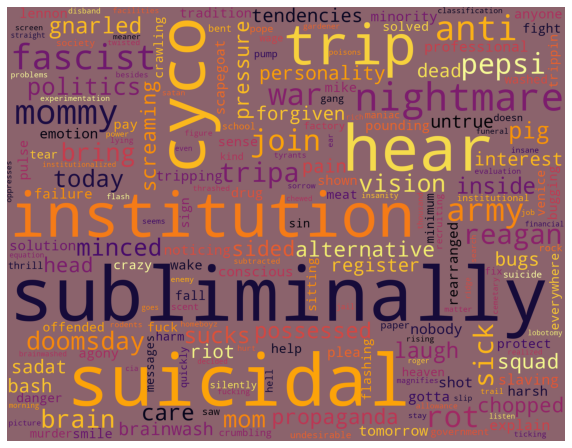

In [70]:
# generate the Suicidal Tendencies wordcloud
create_wordcloud('Suicidal Tendencies', artists_tc_idf['Suicidal Tendencies'], background_color='#8B636C',
                colormap='inferno')

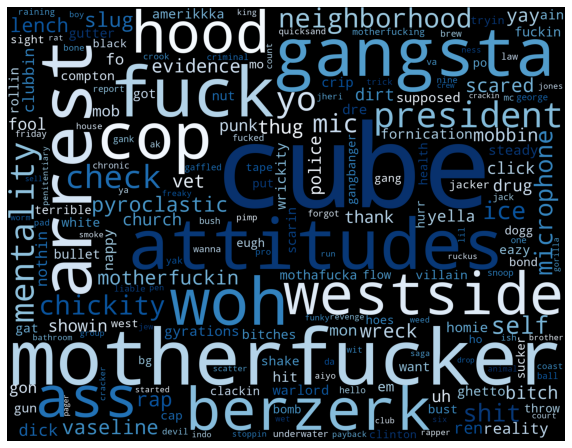

In [71]:
# generate the Ice Cube wordcloud
create_wordcloud('Ice Cube', artists_tc_idf['Ice Cube'], background_color='black', colormap='Blues', censoring=True )

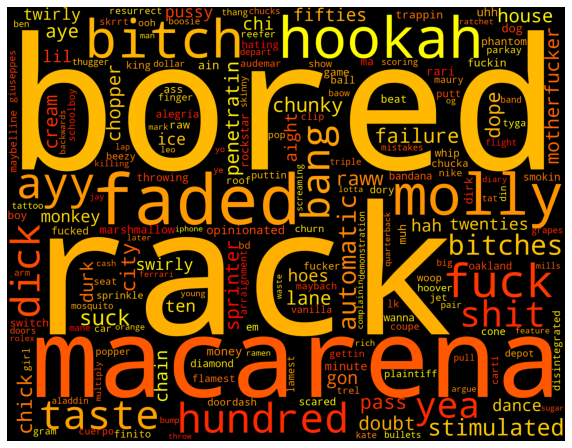

In [72]:
# generate the Tyga wordcloud
create_wordcloud('Tyga', artists_tc_idf['Tyga'], background_color='black', colormap='autumn', censoring=True)

**Now let's show some wordclouds of popular artists for users to guess!**

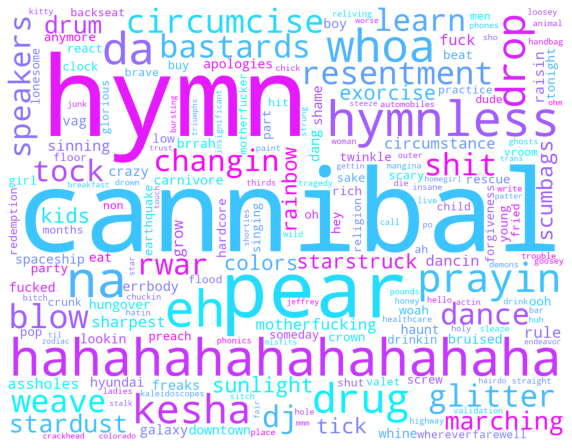

In [73]:
# generate the Kesha wordcloud
create_wordcloud('Kesha', artists_tc_idf['Kesha'],colormap='cool')

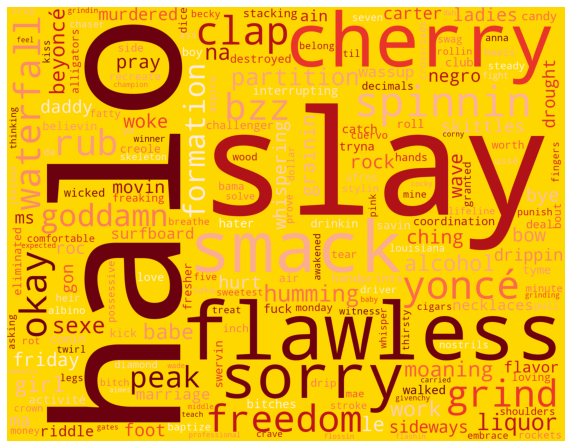

In [74]:
# generate the Beyoncé wordcloud
create_wordcloud('Beyoncé', artists_tc_idf['Beyoncé'],colormap='Reds', background_color='gold')

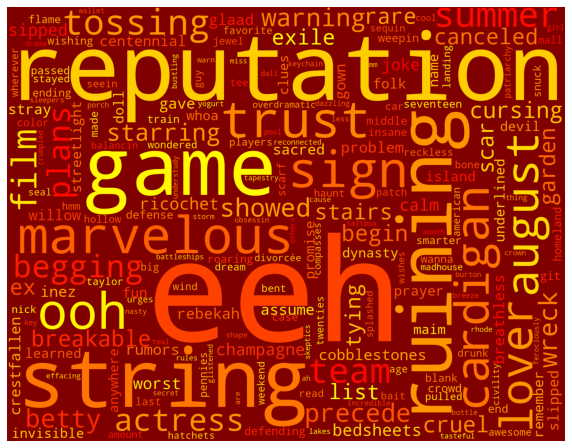

In [75]:
# generate the T Swift wordcloud
create_wordcloud('Taylor Swift', artists_tc_idf['Taylor Swift'],colormap='autumn', background_color='maroon')

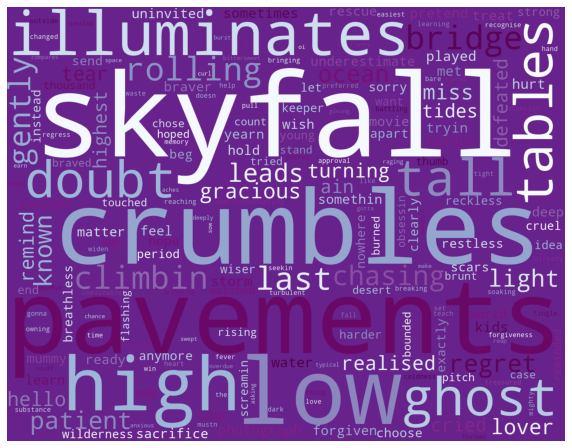

In [76]:
# keep Adele's current safe and see if it changes next week witht he new release.
create_wordcloud('Adele', artists_tc_idf['Adele'], colormap='BuPu', background_color='#68228B')

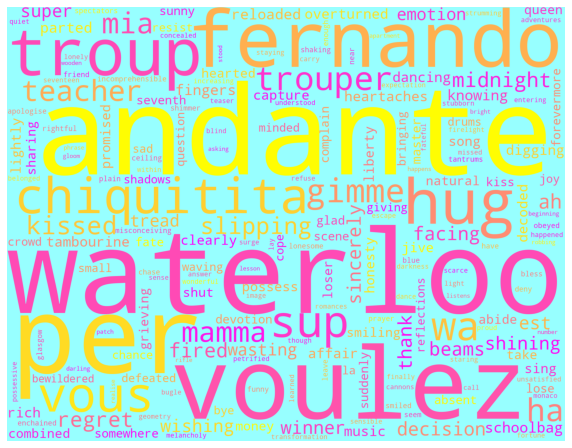

In [77]:
# generate the ABBA wordcloud
create_wordcloud('ABBA', artists_tc_idf['ABBA'],colormap='spring',background_color='#97FFFF')

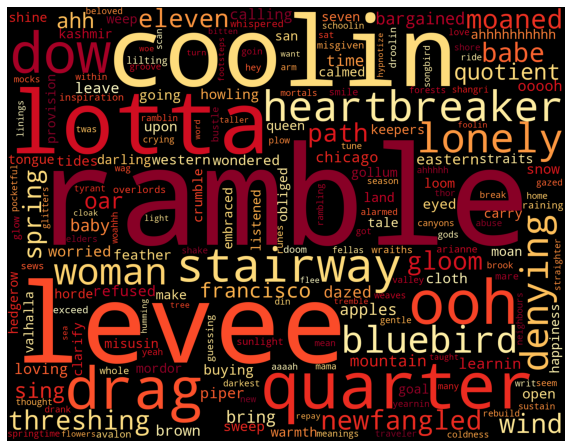

In [78]:
create_wordcloud("Led Zeppelin", artists_tc_idf["Led Zeppelin"],colormap='YlOrRd', background_color='black',
                min_word_length=3)

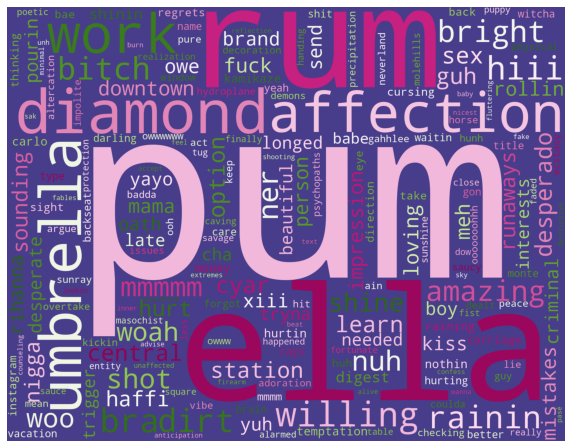

In [79]:
create_wordcloud("Rihanna", artists_tc_idf["Rihanna"],colormap='PiYG', background_color='#483D8B', 
                min_word_length=3)

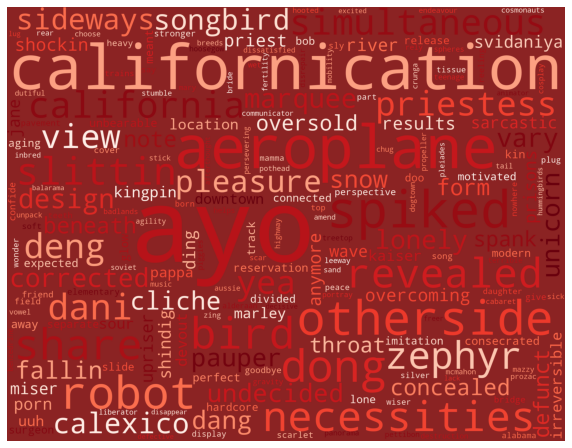

In [80]:
create_wordcloud("Red Hot Chili Peppers", artists_tc_idf["Red Hot Chili Peppers"],colormap='Reds', background_color='#8B2323', 
                min_word_length=3)

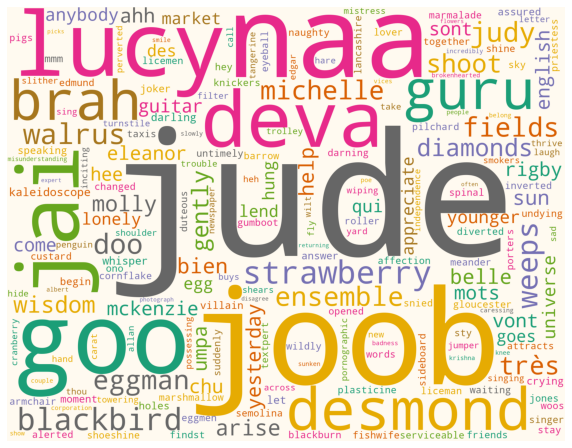

In [81]:
create_wordcloud('The Beatles', artists_tc_idf['The Beatles'],colormap='Dark2', background_color='#FFFAF0',
                min_word_length=3)

**Let's check all 3 of our favorite artists really quickly..**

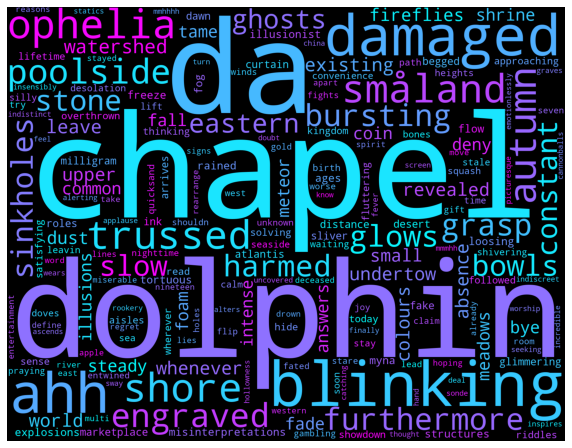

In [82]:
create_wordcloud('Giant Rooks', artists_tc_idf['Giant Rooks'], colormap='cool', background_color='black')

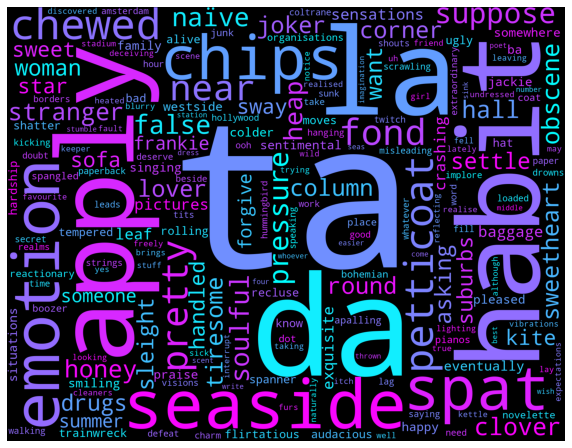

In [83]:
create_wordcloud('The Kooks', artists_tc_idf['The Kooks'], colormap='cool', background_color='black')

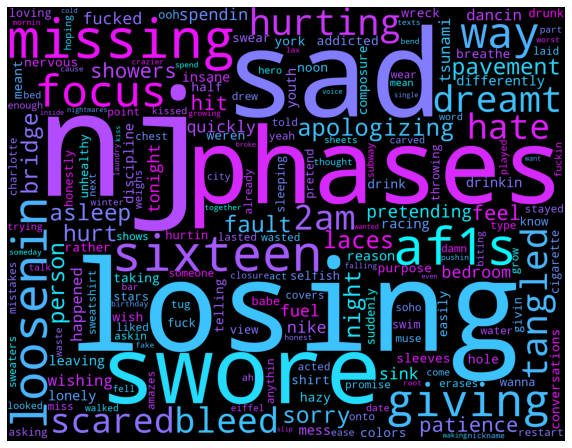

In [84]:
create_wordcloud('Chelsea Cutler', artists_tc_idf['Chelsea Cutler'], colormap='cool', background_color='black')

**Let's check the 2 top degree artists (in + out)**

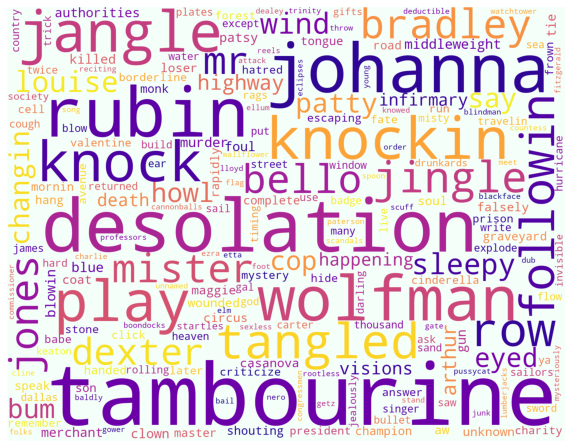

In [85]:
create_wordcloud('Bob Dylan', artists_tc_idf['Bob Dylan'], colormap='plasma', background_color='#F5FFFA') 

In [86]:
sentiment_vader['Bob Dylan'], sentiment_labmt['Bob Dylan']

(0.023102049180327922, 5.533319305628652)

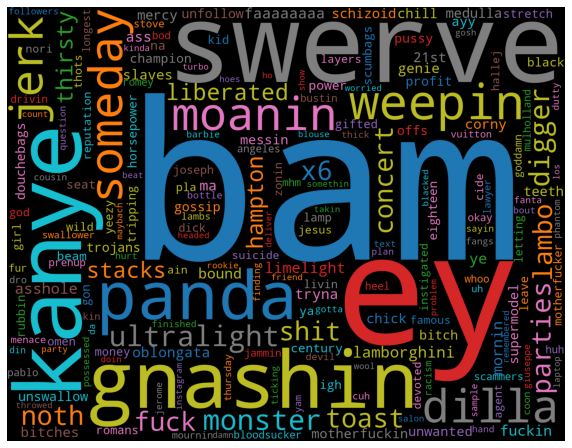

In [87]:
create_wordcloud('Kanye West', artists_tc_idf['Kanye West'], colormap='tab10', background_color='black',
                censoring=True) #tab20

In [88]:
sentiment_vader['Kanye West'], sentiment_labmt['Kanye West']

(-0.00428196303377945, 5.455386755703949)

### Genre Wordclouds
**Now we make wordclouds for genres! Let's take a look at some of them who had a high positivity score with LabMT and VADER, and use concordance to identify which songs they are in.** 
On the website we link to songs based on key words that appear.

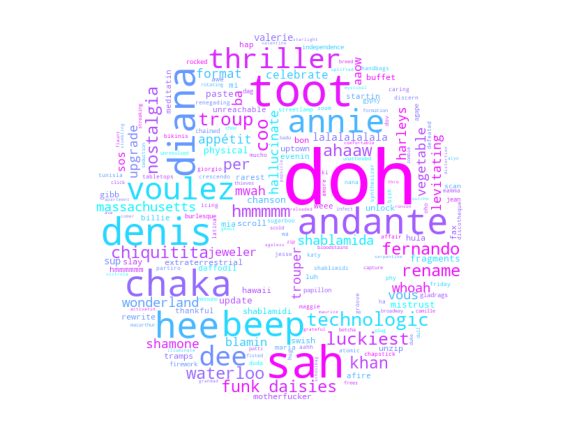

In [89]:
# generate the disco wordcloud
create_wordcloud('disco', genres_tc_idf['disco'], colormap='cool', mask = mask['disco'])

In [90]:
# where does beep appear?
genres_text['disco'].concordance('beep')

Displaying 25 of 64 matches:
olved face to face toot toot , hey , beep beep , toot toot , hey , beep beep t
 face to face toot toot , hey , beep beep , toot toot , hey , beep beep toot t
 hey , beep beep , toot toot , hey , beep beep toot toot , hey , beep beep , t
, beep beep , toot toot , hey , beep beep toot toot , hey , beep beep , toot t
 , hey , beep beep toot toot , hey , beep beep , toot toot , hey , beep beep b
y , beep beep toot toot , hey , beep beep , toot toot , hey , beep beep bad gi
 hey , beep beep , toot toot , hey , beep beep bad girls , talking ’ bout the 
, beep beep , toot toot , hey , beep beep bad girls , talking ’ bout the sad g
l , you ’ re such a naughty bad girl beep beep , uh - huh you bad girl , you s
ou ’ re such a naughty bad girl beep beep , uh - huh you bad girl , you sad gi
l , you ’ re such a naughty bad girl beep beep , uh - huh now you and me , we 
ou ’ re such a naughty bad girl beep beep , uh - huh now you and me , we are b
rl is out at night toot

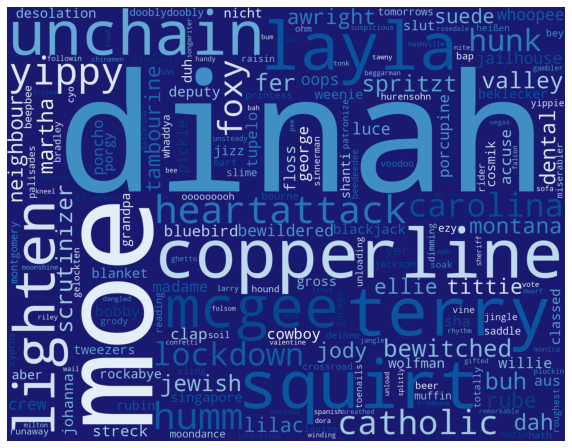

In [91]:
create_wordcloud('blues', genres_tc_idf['blues'],colormap='Blues_r', background_color='#191970',min_word_length=3)

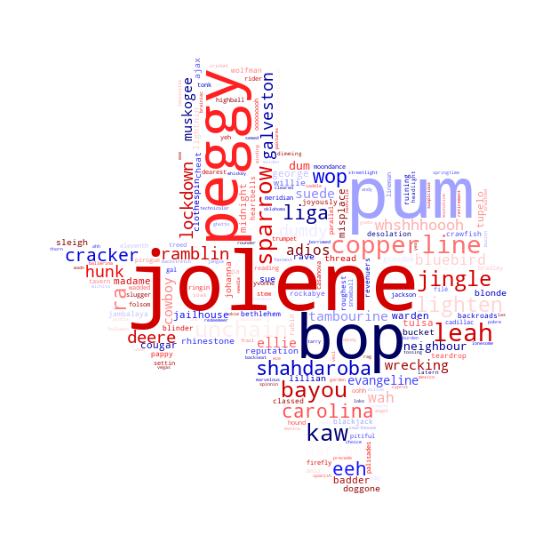

In [92]:
create_wordcloud('country music', genres_tc_idf['country music'],colormap='seismic',
                 mask= mask['country music'])

**Time for the least positive genres review.. do they look different than the above?**

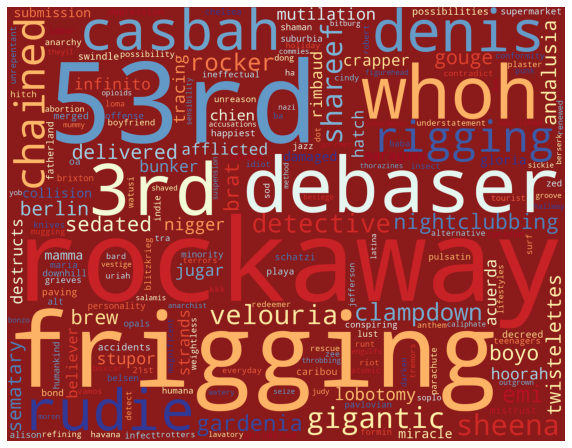

In [93]:
create_wordcloud('punk rock', genres_tc_idf['punk rock'], background_color='#8B1A1A',
                colormap='RdYlBu', censoring=True)

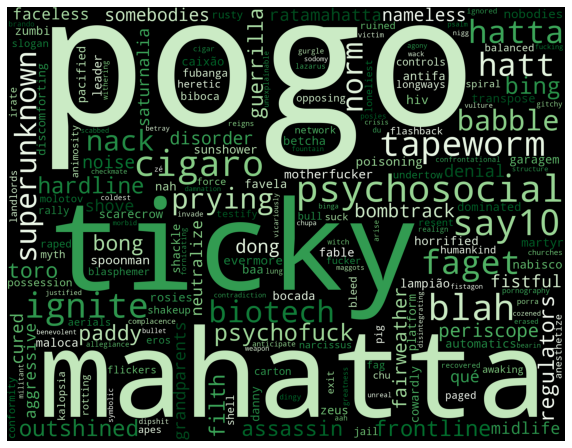

In [94]:
# alternative metal
create_wordcloud('alternative metal', genres_tc_idf['alternative metal'], background_color='black',
                colormap='Greens')

In [95]:
genres_text['alternative metal'].concordance('ticky')

Displaying 20 of 20 matches:
ng " ding dang a dong bong bing bong ticky ticky thought of a gun every time i 
ing dang a dong bong bing bong ticky ticky thought of a gun every time i try to
' about , i said why why why it ' ll ticky ticky ticky ticky son of a gun ding 
t , i said why why why it ' ll ticky ticky ticky ticky son of a gun ding ding d
said why why why it ' ll ticky ticky ticky ticky son of a gun ding ding dong a 
hy why why it ' ll ticky ticky ticky ticky son of a gun ding ding dong a bong b
ding ding dong a bong bong bing bong ticky ticky thought of a gun bing bing ban
ing dong a bong bong bing bong ticky ticky thought of a gun bing bing bang a ba
hy ? ding dang a dang bong bing bong ticky ticky thought of a gun every time i 
ing dang a dang bong bing bong ticky ticky thought of a gun every time i try to
m i on the run ? why why why it ' ll ticky ticky ticky ticky ticky ticky dawn o
 the run ? why why why it ' ll ticky ticky ticky ticky ticky ticky dawn of a gu
un ? why wh

### Community wordclouds

**Finally let's show wordclouds for each community**

We want to see if there are any clearly recognizeable artists or songs within the communities, based on what we saw above for the artists and genres. Communities actually make certain artists more easy to identify, since artists can only be in one community! On the website we link to specific songs that come up, and list out the amount of times certain key words are used by that community.

**Community 0: Michael Jackson-Mariah Carey-Stevie Wonder**

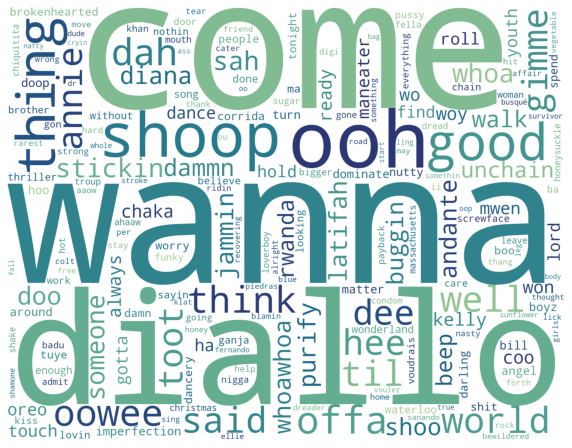

In [96]:
create_wordcloud('0', comm_tc_idf['0'], colormap='crest_r')

In [97]:
comm_text['0'].concordance('wanna')

Displaying 25 of 1139 matches:
 digging the dancing queen i don ' t wanna talk about things we ' ve gone throu
es it all ( takes it all ) i don ' t wanna talk if it makes you feel sad and i 
aken by surprise ( hug , hug him , i wanna kiss him ) when i kissed the teacher
ssed the teacher ( hug , hug him , i wanna kiss him ) couldn ' t quite believe 
believe his eyes ( hug , hug him , i wanna kiss him ) when i kissed the teacher
ssed the teacher ( hug , hug him , i wanna kiss him ) my whole class went wild 
 was in a trance ( hug , hug him , i wanna kiss him ) when i kissed the teacher
ssed the teacher ( hug , hug him , i wanna kiss him ) suddenly i took the chanc
 took the chance ( hug , hug him , i wanna kiss him ) when i kissed the teacher
ssed the teacher ( hug , hug him , i wanna kiss him ) leaning over me he was tr
what a crazy day ( hug , hug him , i wanna kiss him ) when i kissed the teacher
ssed the teacher ( hug , hug him , i wanna kiss him ) all my sense had flown aw
e had flo

**Community 1: Metallica-Queen-Led Zeppelin**

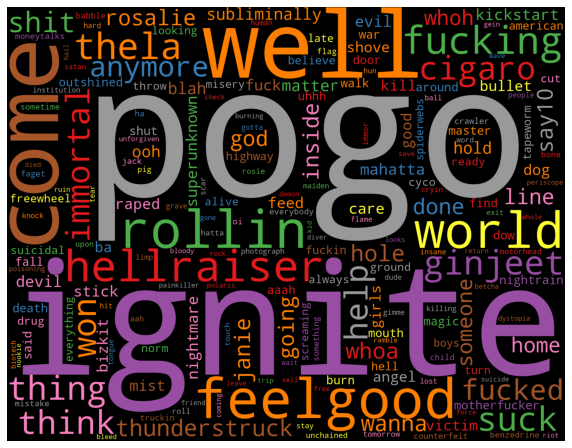

In [98]:
create_wordcloud('1', comm_tc_idf['1'], colormap='Set1_r', background_color='black')

In [99]:
comm_text['1'].concordance('world')

Displaying 25 of 543 matches:
e girl my twisted passion to be your world lost inside my sick head i live for 
anie got a gun janie got a gun whole world ' s come undone from lookin ' straig
u there ' s something wrong with the world today i don ' t know what it is some
e there ' s something wrong with the world today the light bulb ' s getting dim
d there ' s something right with the world today and everybody knows it ' s wro
e you a star girl , we ' ll take the world by storm , it isn ' t that hard ' ca
out of my mind keeping an eye on the world from so many thousands of feet off t
me trouble finding your place in the world i know how much that hurts but if yo
me trouble finding your place in the world i know how much that hurts and if yo
he walls black and scream " fuck the world ! ‘ cause it ’ s my life , i ' m gon
er , the kids in the dark so let the world sing , " what a shame ! hey ! what a
er , the kids in the dark so let the world sing , " what a shame ! hey ! what a
er , the k

**Community 2: Rihanna-Taylor Swift-Britney Spears**

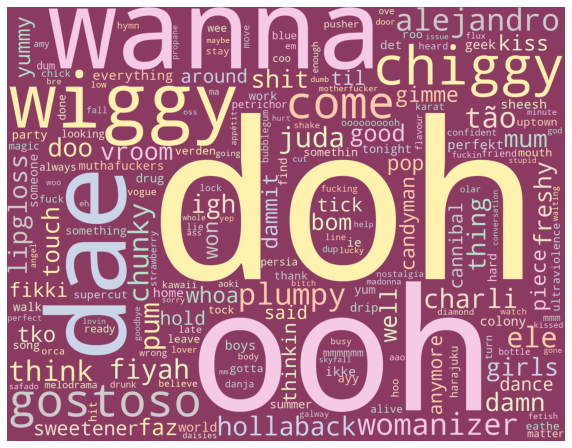

In [100]:
create_wordcloud('2', comm_tc_idf['2'], colormap='Pastel2', background_color='#8B3A62')

**Community 3: David Bowie-U2-Nirvana**

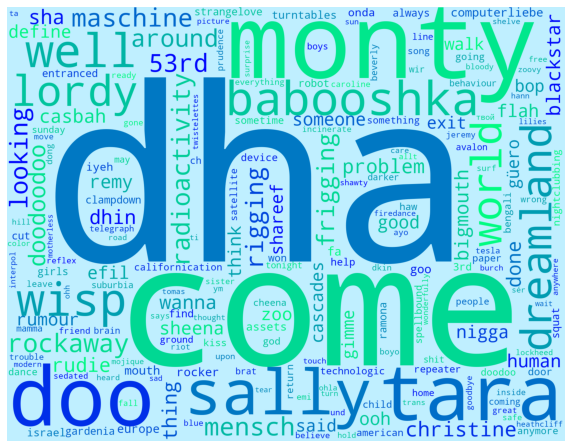

In [101]:
create_wordcloud('3', comm_tc_idf['3'], colormap='winter', background_color='#BFEFFF')

**Community 4 (censored): Kanye West-Eminem-Beyoncé**


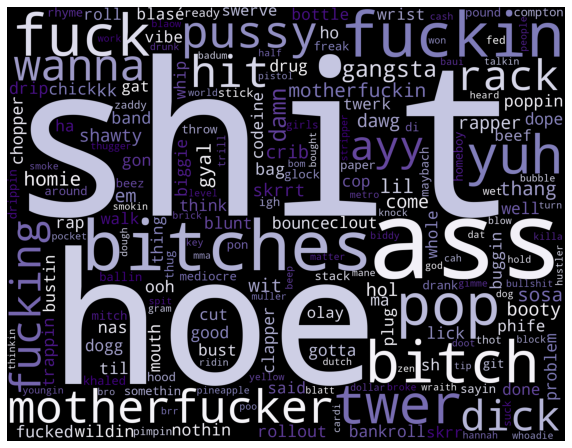

In [102]:
create_wordcloud('4', comm_tc_idf['4'], colormap='Purples', background_color='black', censoring=True)

In [103]:
comm_text['4'].concordance('bitches')

Displaying 25 of 1290 matches:
i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
ybe we can solve it , ayy hold up , bitches simmer down ( uh ) takin ' hella lo
eah ) gettin ' figures and fuckin ' bitches , she rollin ' swishers brought her
, she rollin ' swishers brought her bitches , i brought my niggas ( uh ) they g
er fuckin ' boys , beast i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
ng talkin ', i ' m beast i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
in ' problem ( problem ) i love bad bitches , that ' s my fuckin ' problem ( pr
k , i ' ll do ya , beast i love ba

**Community 5: Amy Grant-Michael W. Smith-Steven Curtis Chapman**

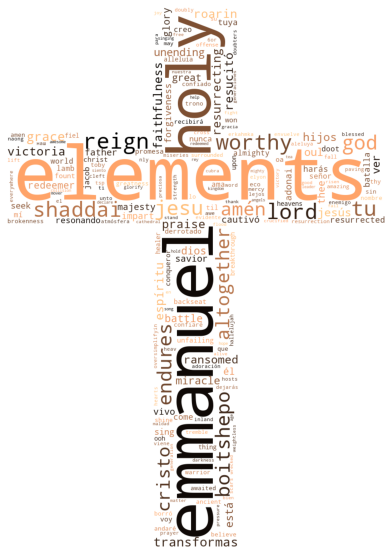

In [104]:
create_wordcloud('5', comm_tc_idf['5'], mask = mask['5'], colormap='copper')

In [105]:
comm_text['5'].concordance('god')

Displaying 25 of 406 matches:
the outcast on her knees you were the god who really sees and by your might you
 upward to zion the beautiful city of god the sorrows of the mind be banished f
ose refuse to sing who never knew our god ; but favorites of the heavenly king 
y speak their joys abroad refrain the god that rules on high and thunders when 
d manages the seas refrain this awful god is ours our father and our love ; he 
 ; he is the prince of peace , mighty god , holy one ! emmanuel , emmanuel emma
 ; he is the prince of peace , mighty god , holy one ! emmanuel , emmanuel emma
 ; he is the prince of peace , mighty god , holy one ! emmanuel , emmanuel emma
 ; he is the prince of peace , mighty god , holy one ! emmanuel , emmanuel , em
at there ' s just no getting over you god loves a lullaby in a mother ' s tears
ht better than a hallelujah sometimes god loves the drunkard ' s cry the soldie
ah sometimes we pour out our miseries god just hears a melody beautiful , the m
ah sometim

**Community 11: Bob Dylan-The Beatles-Elton John**

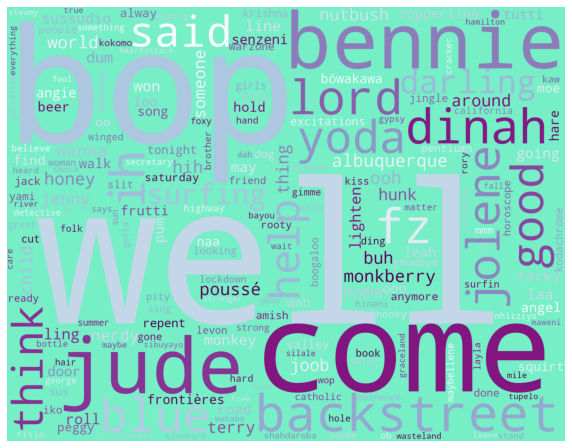

In [106]:
create_wordcloud('11', comm_tc_idf['11'], colormap='BuPu_r', background_color='#76EEC6')

**Community 14: Jennifer Lopez-Pitbull (rapper)-Shakira**

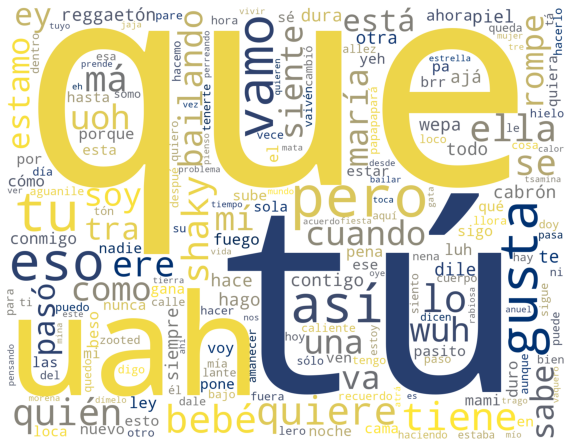

In [107]:
create_wordcloud('14', comm_tc_idf['14'], colormap='cividis')

**Community 16: Booba-Gims-Dadju**

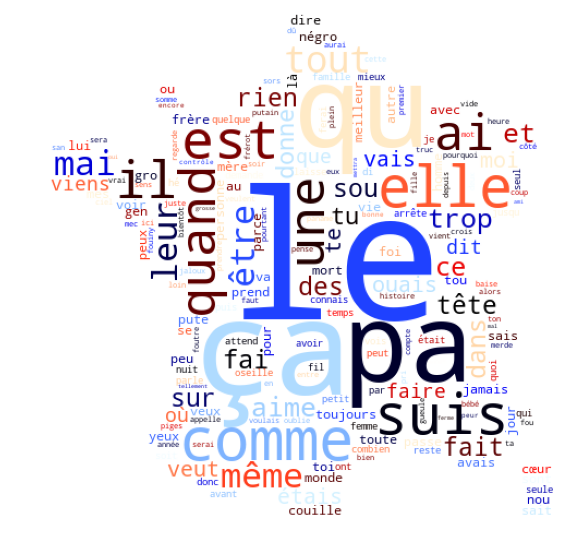

In [108]:
create_wordcloud('16', comm_tc_idf['16'], colormap='flag', mask=mask['16'])

**Community 18: AnnenMayKantereit-Element of Crime-Von Wegen Lisbeth**

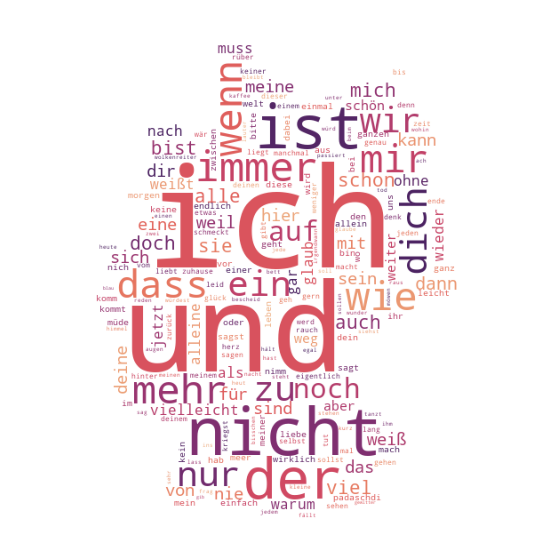

In [109]:
create_wordcloud('18', comm_tc_idf['18'], colormap='flare', 
                 mask=mask['18'])

# 4. Discussion. Think critically about your creation


### Lyric analysis
#### What went well?
1. Having a dataset of nearly 400 artists made for a very diverse group of text to analyse. Since 347 of them are the top degree of our artist network, we expect the majority of people have heard or listened to some of these artists. The individual artist wordclouds are extremely nice and very recognizeable.

#### What is still missing? 
1. We wanted to explore topic modeling but did not have enough time.
2. We could add more functions to the wordcloud generation to potentially clean up language differences (for example, to hide tokens that are not English) 
3. We would like to add even more artists to the analysis at some point.
4. We wanted to explore sentiment analysis across songs or albums of individual artists. Using the Genius Lyrics API we could save song lyrics in a json for easy lookup across artist, album, song, and lyrics. This could be done during a next phase.
5. We have a lot of content for individual artists, but not so much for genres and communities. We could add more.


#### What could be improved? Why?
1. The sentiment analysis and TC-IDF scores for genres could have been improved. We chose to only analyse the top 25 occurring genres based on the list of 397 artists whose lyrics we analysed. Since artists can be attached to more than one genre in Wikipedia, this caused certain "strange" words to appear in multiple genre wordclouds. While the wordclouds are indeed accurate, we think the handling of genres could potentially be adjusted in some way. Also, artists can switch genres throughout their career, or have songs that span a variety of genres. We may be able to choose the first genre linked in Wikipedia.. but that also may not represent the artist fully. 
2. A second aspect of genre TC-IDF scores that caused problems, is that some genres had a single artist that had a couple Spanish songs - which means for TC-IDF calculation, essentially ALL of those Spanish words would be shown in the wordcloud. The end result is accurate, but we may not want a single artist's non-English tokens to dominate the entire genre! However, we wanted to include the non-English speaking artists in TC-IDF calculation, especially since we knew we had 3 communities that focused solely on non-English speaking artists. 
3. Calculating the TC, IDF, and TC-IDF across 397 artist texts, 25 genres texts, and 10 communities texts takes upwards of 7 hours to compute. We could look into optimising those functions, since we ended up needing to generate these scores at least 10 times throughout this process (after either adjusting the network analysed, or after noticing some issues with the content inside the txt files).
4. Matching the artist names from the network into Genius took manual review - the API sometimes changed the artist name to something completely different. This means we had to monitor the output of all 397 artists' lyrics download to check if Genius switched their name to something else and downloaded the wrong lyrics.
